In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.figure as fgr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import math
import statistics as stts
from pandas.plotting import autocorrelation_plot
from matplotlib.patches import Rectangle
from scipy import interpolate
from statsmodels.tsa.stattools import acf  
from enum import Enum
from colorama import Fore
from datetime import datetime, timedelta

from mpylib import getPlotAx, formatPlotAx, adjustPlotView, closestDateTimeTo, closestElapsedTimeTo, hilitePlots

In [3]:
class TemperatureDataFiles(Enum):
    m012 = 'data_source/m012_rsc_rxl_cryocooler_temperature1.csv'
    m016 = 'data_source/m016_rsc_rxl_cryocooler_temperature1.csv'
    m020 = 'data_source/m020_rsc_rxl_cryocooler_temperature1.csv'
    m024 = 'data_source/m024_rsc_rxl_cryocooler_temperature1.csv'
    m028 = 'data_source/m028_rsc_rxl_cryocooler_temperature1.csv'
    m030 = 'data_source/m030_rsc_rxl_cryocooler_temperature1.csv'

time_units = {
    'S':'sec', 
    'T':'min'
}

def dataVals_for_regrid_timestamp(new_timestamp, old_timestamp, val, interp_kind='slinear'):
    spl = interpolate.interp1d(old_timestamp, val, kind=interp_kind, fill_value="extrapolate")
    return spl(new_timestamp)

def get_plot_ax()->plt.Axes:
    ax:plt.Axes = getPlotAx()
    return ax

def format_ax(ax:plt.Axes):
    formatPlotAx(ax=ax) 

def adjust_plot_view(ax:plt.Axes=None, xMin:int|float|str=None, xMax:int|float|str=None, yMin:int|float|str=None, yMax:int|float|str=None): 
    adjustPlotView(ax=ax, xMin=xMin, xMax=xMax, yMin=yMin, yMax=yMax)

def closest_dateTime_to(elapsed_time:int|float, in_dataframe:pd.DataFrame): 
    dtTmRslt = closestDateTimeTo(elapsed_time=elapsed_time, in_dataframe=in_dataframe)
    return dtTmRslt

def closest_elapsedTime_to(dateTime_string:str, in_dataframe:pd.DataFrame):
    elpsdTmRslt = closestElapsedTimeTo(dateTime_string=dateTime_string, in_dataframe=in_dataframe)
    return elpsdTmRslt

def remove_duplicates_in_list(_list:list)->list:
    return list(dict.fromkeys(_list))

def hilite_plots(on_ax:plt.Axes, for_data=pd.DataFrame(), from_elapsed_time=None, to_elapsed_time=None, is_dateTime_axis=False, show_time_windows=False, win_size=None, time_delta=None, min_y=None, max_y=None, hlt_clrs:list[str]=['lightsteelblue','aliceblue'], hlt_alpha:list[float]=[0.75,0.75], edge_clr='none'):        
    hilitePlots(on_ax=on_ax, for_data=for_data, from_elapsed_time=from_elapsed_time, to_elapsed_time=to_elapsed_time, is_dateTime_axis=is_dateTime_axis, show_time_windows=show_time_windows, win_size=win_size, time_delta=time_delta, min_y=min_y, max_y=max_y, hlt_clrs=hlt_clrs, hlt_alpha=hlt_alpha, edge_clr=edge_clr)


In [4]:
class SensorDataPlots:
    class SensorData: #Creates an instance of the dataframe and graph for each source file 
        def __init__(self, instanceName:str, atSensorLoc:str, samplingFreq:str): 
            self.__df_original:pd.DataFrame = pd.DataFrame()
            self.__df:pd.DataFrame = pd.DataFrame() 
            self.__ax:plt.Axes = None
            self.__refName:str = instanceName
            self.__sensorLoc:str = atSensorLoc
            self.__sampling_freq:str = samplingFreq
            self.__time_delta:int = int(samplingFreq[:-1])
            self.__time_unit:str = time_units[samplingFreq[-1]]
            self.__completeInit()

        def __completeInit(self): #loads the data from the source file(s) and prepares them
            dataFile = None
            for k in TemperatureDataFiles:  
                if k.name==self.__sensorLoc:
                    dataFile = k.value
                    break

            if dataFile==None:
                print(Fore.RED+"\nError! "+Fore.GREEN+"Data file cannot be located. Make sure you have indicated the data file (with its path).\n") #Error Message
            else:
                df = pd.read_csv(dataFile, header=0, sep=',', usecols=['timestamp','value']) 
                df.dropna(inplace=True)     #removing any records containing an empty cell
                df.timestamp = pd.to_numeric(df.timestamp)
                df.timestamp = [round(df.timestamp[j]) for j in range(len(df))]
                df.drop_duplicates(subset='timestamp', inplace=True)    #removing duplicates in 'timestamp'
                df.sort_values(by='timestamp', ascending=True, inplace=True)    
                oldTmStmp = pd.Series(df.timestamp.tolist())                    
                df.rename(columns={'timestamp':'Date_Time', 'value':'Value'}, inplace = True)
                df.Date_Time = list(map(datetime.fromtimestamp, df.Date_Time))
                df.set_index('Date_Time', inplace=True)
                df.sort_index(ascending=True, inplace=True)     #ensuring the index is sorted, in ascending order
                df.Value = pd.to_numeric(df.Value)
                
                self.__df_original = df.copy()
                oldVals = pd.Series(df.Value.tolist())

                df = df.asfreq(self.__sampling_freq) #Adjusts dateTime (index values) so that the same time interval (self.__time_delta) is maintained.
                newTmStmp = [(df.index[j].timestamp()) for j in range(len(df))]        
                newVals = dataVals_for_regrid_timestamp(new_timestamp=pd.Series(newTmStmp), old_timestamp=oldTmStmp, val=oldVals)   
                df.Value = [round(x, 5) for x in newVals] 
                df['Elapsed_Time'] = [self.__time_delta*j for j in (range(len(df.index)))]
                
                self.__df = df.copy()
                

        def plotData(self, forSingle:bool=True, subPlotIndx:int=1, subPlots:int=1, is_dateTime_axis:bool=False, plotColor:str='b'):  #is_dateTime_axis indicates whether plots should be values against date-time or elapsed time fields in the the dataframe
            xlbl = f'Elapsed Time [{self.__time_unit}]'
            if is_dateTime_axis:
                xlbl = 'Date-time'

            nRws:int=1; nCols:int=3; fgHt=10; ax:plt.Axes=None  
            if forSingle:
                nCols = 1
                fg = plt.figure(self.__refName, figsize=(30,10))
                fg.suptitle("")
                ax = plt.subplot(nRws,nCols,subPlotIndx)                    
            else:
                if subPlots != 3:
                    nCols = 2
                    nRws = math.trunc(subPlots/nCols) 
                    if nCols*nRws < subPlots:  
                        nRws += 1
                    fgHt = fgHt*nRws

                fg = plt.figure(self.__refName, figsize=(30,fgHt))
                fg.suptitle(f"\nTemperature Readings", fontweight='semibold')  
                ax = plt.subplot(nRws, nCols, subPlotIndx)

            plt.cla()
            start_date_time = self.__df.iloc[0].name
            if is_dateTime_axis:
                ax.plot(self.__df.index, self.__df.Value, color=plotColor)
            else:
                ax.plot(self.__df.Elapsed_Time, self.__df.Value, color=plotColor)
            ax.set_title(f'\n{self.__sensorLoc} (from {start_date_time})')    
            
            if forSingle or math.fmod(subPlotIndx, nCols)==1:
                ax.set_xlabel(xlbl) 
                ax.set_ylabel(f"Temperature [K]") 
            
            format_ax(ax=ax)
            if is_dateTime_axis:
                for tk in ax.get_xticklabels():
                    tk.set_rotation(30)
            self.__ax = ax
            plt.tight_layout()
            return self.__ax
        
        def adjust_plot_view(self,xMin,xMax,yMin,yMax):
            if self.__ax==None:
                print(Fore.RED+"\nError! "+Fore.GREEN+"The plot you are referencing does not exist. Generate the plot before issuing command to adjust it.\n") #Error Message
            else:
                adjust_plot_view(self.__ax, xMin=xMin, xMax=xMax, yMin=yMin, yMax=yMax)

        def dateTime_of_elapsed_time(self, elapsed_time)->str:
            elapsed_DateTime = None
            upperLmt = self.__df.Elapsed_Time[-1]
            if elapsed_time<0 or elapsed_time>upperLmt:
                 print(Fore.RED+"\nError! FIRST"+Fore.GREEN+f"The 'elapsed_time' argument provided is invalid. It should be between zero and {upperLmt} inclusive.\n")    #Error Message
            else:
                if self.__sampling_freq[-1]=='T':
                    elapsed_DateTime = self.__df.iloc[0].name + pd.DateOffset(minutes=elapsed_time)
                else: 
                    elapsed_DateTime = self.__df.iloc[0].name + pd.DateOffset(seconds=elapsed_time)
            return elapsed_DateTime
        
        def closest_dateTime_to(self, elapsed_time): 
            return closest_dateTime_to(elapsed_time=elapsed_time, in_dataframe=self.__df)

        def closest_elapsedTime_to(self, dateTime_string:str):
            elpsdTmRslt = closest_elapsedTime_to(dateTime_string=dateTime_string, in_dataframe=self.__df) 
            return elpsdTmRslt

        def getOriginalData(self):
            return self.__df_original.copy()

        def getTimeDelta(self):
            return self.__time_delta 

        def getTimeUnit(self):
            return self.__time_unit   

        def data_for_elapsedTime_range(self, startTime, endTime):
            rslt = pd.DataFrame(); startTm=None; endTm=None
            if startTime==None and endTime==None:
                rslt = self.__df.copy()
            else:
                startTm_elpsd=None; endTm_elpsd=None
                if startTime==None:
                    startTm_elpsd = 0
                else:
                    startTm_elpsd = float(startTime)

                if endTime==None:
                    endTm_elpsd = float(self.__df.Elapsed_Time[-1]) 
                else:
                    endTm_elpsd = float(endTime)

                if endTm_elpsd>startTm_elpsd:
                    startTm = self.closest_dateTime_to(startTm_elpsd)
                    endTm = self.closest_dateTime_to(endTm_elpsd)
                    rslt = (self.__df[startTm:endTm]).copy()
                else:
                    print(Fore.RED+"\nError! "+Fore.GREEN+f"The 'endTime' argument should be greater than the 'startTime' argument.\n")    #Error Message
            return rslt  



    def __init__(self, instanceName:str, atSensorLoc:str='all', samplingFreq:str='10T'):  
        self.__refName:str = None                      
        self.__sensorLoc:str = atSensorLoc
        self.__plotsData:dict = dict() 
        self.__completeInit(instanceName, samplingFreq) 

    def __completeInit(self, rfName:str, samplingFreq):  
        noneTest = "none"
        if isinstance(rfName,str):
            noneTest = rfName.lower()

        if  noneTest=="none" or "":
            print(Fore.RED+"\nError! "+Fore.GREEN+"It is required that you enter a valid instanceName for this method's class object. Kindly use a string that is NOT in ANY FORM of the string 'None'\n") #Error Message
        else:
            self.__refName = rfName 
            verifiedSensorLoc = self.__verifiedSensorlocation(self.__sensorLoc)
            if verifiedSensorLoc=='all': 
                sbPltNdx = 1
                for loc in TemperatureDataFiles:  
                    self.__plotsData[loc.name] = self.SensorData(self.__refName,loc.name,samplingFreq)  
                    sbPltNdx += 1
            elif not(verifiedSensorLoc==None):
                self.__plotsData[self.__sensorLoc] = self.SensorData(self.__refName,verifiedSensorLoc,samplingFreq)  
            
            
    def __hasRefName(self): #This is required to make sure the right plot figure is referenced
        if self.__refName==None: return False
        else: return True

    def __verifiedSensorlocation(self, atSensorLoc:str):
        if atSensorLoc=="all":
            if self.__sensorLoc=='all':
                return 'all'
            else:
                sLoc = None
                for loc in TemperatureDataFiles:    
                    if loc.name==self.__sensorLoc:
                        sLoc = self.__sensorLoc
                        break
                if sLoc==None:
                    print(Fore.RED+"\nError! "+Fore.GREEN+"You have entered an invalid value for the sensor location.\n")  #Error Message
                    return None
                else:
                    return sLoc
        else:
            sLoc = None
            for loc in TemperatureDataFiles:    
                if loc.name==atSensorLoc:
                    sLoc = atSensorLoc
                    break
            if sLoc==None: 
                print(Fore.RED+"\nError! "+Fore.GREEN+"You have entered an invalid value for the sensor location.\n")  #Error Message
                return None
            elif not(sLoc==None) and (self.__sensorLoc=='all' or sLoc==self.__sensorLoc): 
                return sLoc
            else:
                print(Fore.RED+"\nError! "+Fore.GREEN+f"You have entered an invalid value for the sensor location. You should specify the same location you did for the argument 'forPhysicalCondition', when creating the class instance with the instanceName '{self.__refName}'\n")  #Error Message
                return None

    def number_sensor_locations(self):
        return len(self.__plotsData)

    def plotData(self, atSensorLoc:str="all", is_dateTime_axis:bool=False): 
        if self.__hasRefName():  
            verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)   
            if verifiedSensorLoc=='all': 
                axs:list[plt.Axes] = []
                sbPlts = self.number_sensor_locations()
                sbPltNdx = 1
                for loc in TemperatureDataFiles:    
                    ax = self.__plotsData[loc.name].plotData(forSingle=False, subPlotIndx=sbPltNdx, subPlots=sbPlts, is_dateTime_axis=is_dateTime_axis)
                    axs.append(ax)
                    sbPltNdx += 1
                return axs
            elif not(verifiedSensorLoc==None):
                ax = self.__plotsData[verifiedSensorLoc].plotData()
                return ax
            else:
                print(Fore.RED+"\nError! "+Fore.GREEN+"Plot could not be generated due to invalid value provided for the sensor location.\n")  #Error Message
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+"Data for plot has not been loaded.\n") #Error Message
    
    def adjust_plot_view(self, xMin=None, xMax=None, yMin=None, yMax=None, atSensorLoc:str="all"):
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if self.__hasRefName():  
            if verifiedSensorLoc=='all':
                for loc in TemperatureDataFiles:
                    self.__plotsData[loc.name].adjust_plot_view(xMin=xMin,xMax=xMax,yMin=yMin,yMax=yMax)
            elif verifiedSensorLoc != None:
                self.__plotsData[verifiedSensorLoc].adjust_plot_view(xMin=xMin,xMax=xMax,yMin=yMin,yMax=yMax)
            elif (verifiedSensorLoc != 'all') and (atSensorLoc != self.__sensorLoc):
                print(Fore.RED+"\nError! "+Fore.GREEN+"Plot view could not be adjusted. Use the same sensor location for which the original plot was created.\n")  #Error Message
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+"The plot you are referencing does not exist.\n") #Error Message

    def get_original_data(self, atSensorLoc:str="all"):
        rslt = None
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            rslt = self.__plotsData[verifiedSensorLoc].getOriginalData()
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Sensor data could not be obtained. Use the same sensor location indicated when loading the plot data.\n")  #Error Message
        return rslt 

    def get_data(self, atSensorLoc:str="all"):  
        rslt = self.get_data_for_elapsedTime_range(atSensorLoc=atSensorLoc)
        return rslt 

    def get_data_for_elapsedTime_range(self, startTime=None, endTime=None, atSensorLoc:str='all'): 
        rslt = None
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            rslt = self.__plotsData[verifiedSensorLoc].data_for_elapsedTime_range(startTime, endTime)
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Sensor data could not be obtained. Use the same sensor location indicated when loading the plot data.\n")  #Error Message
        return rslt

    def get_time_delta(self, atSensorLoc:str='all'):
        rslt = None
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            rslt = self.__plotsData[verifiedSensorLoc].getTimeDelta()
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Sensor data could not be obtained. Use the same sensor location indicated when loading the plot data.\n")  #Error Message
        return rslt

    def find_elapsed_dateTime(self, forElapsedTime, atSensorLoc='all'): 
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            elapsed_DateTime = self.__plotsData[verifiedSensorLoc].dateTime_of_elapsed_time(elapsed_time=forElapsedTime)
            print(Fore.GREEN+f"\nThe Date-time for the Elapsed Time "+Fore.MAGENTA+f"{forElapsedTime} {self.__plotsData[verifiedSensorLoc].getTimeUnit()}(s) "+Fore.GREEN+"is "+Fore.YELLOW+f"{elapsed_DateTime}\n\n")
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Elapsed Date-time could not be calculated. Use the same sensor location indicated when loading the plot data.\n")  #Error Message

    def get_closest_dateTime(self, toElapsedTime, atSensorLoc='all'): 
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            elapsed_DateTime = self.__plotsData[verifiedSensorLoc].closest_dateTime_to(elapsed_time=toElapsedTime)
            return elapsed_DateTime
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Closest Date-time could not be calculated. Use the same sensor location indicated when loading the plot data.\n")  #Error Message

    def get_closest_elapsedTime(self, toDateTime_string, atSensorLoc='all'):
        verifiedSensorLoc = self.__verifiedSensorlocation(atSensorLoc)
        if verifiedSensorLoc=='all':
            print(Fore.RED+"\nError! "+Fore.GREEN+"You can issue this command for only one sensor location at a time.\n")  #Error Message
        elif not(verifiedSensorLoc==None):
            elapsed_DateTime = self.__plotsData[verifiedSensorLoc].closest_elapsedTime_to(dateTime_string=toDateTime_string)
            return elapsed_DateTime
        elif not(verifiedSensorLoc=='all') and not(atSensorLoc==self.__sensorLoc):
            print(Fore.RED+"\nError! "+Fore.GREEN+"Closest Time elapsed could not be determined. Use the same sensor location indicated when loading the plot data.\n")  #Error Message


"""
#COMMANDS TO INITIALIZE DATA AND GENERATE FIRST PLOTS
temp_all = SensorDataPlots(
    instanceName="temp_all",    #required argument, and should be unique for each instance of SensorDataPlots created
    #atSensorLoc=TemperatureDataFiles.m016.name,    #optional argument; if omitted, prepares dataFrames for all sensor locations
    #samplingFreq='10T'    #optional argument, should be in minutes[append value with T] or seconds [append value with S]; default value is '10T' (i.e. 10 mins). 
) 
temp_all.plotData() #atSensorLoc=TemperatureDataFiles.m016.name) #optional argument
temp_all.adjust_plot_view(xMin = None, xMax = None, yMin = 17, yMax = 40) #, atSensorLoc=TemperatureDataFiles.m016.name  #optional argument; x and y limit values should be of type int or float (when used with respect to time elapsed) or of str type (representing date-time value, given in the form yyyy-mm-DD hh:mm:ss) 
temp_all.get_Elapsed_DateTime(forElapsedTime=5000, atSensorLoc=TemperatureDataFiles.m016.name) #obtains the date-time corresponding to a given elapsed time
"""
print(Fore.RESET)

Intializing and Visualizing Data for all locations

In [5]:
#--Creates initial DataFrames for sensors of the indicated physical condition at a ALL locations
tempPlot_all = SensorDataPlots(
    instanceName='tempPlot_all',
    #atSensorLoc=TemperatureDataFiles.m016.name,
    samplingFreq = '10T'      #T or M for minutes, S for seconds, H for hour  
) 

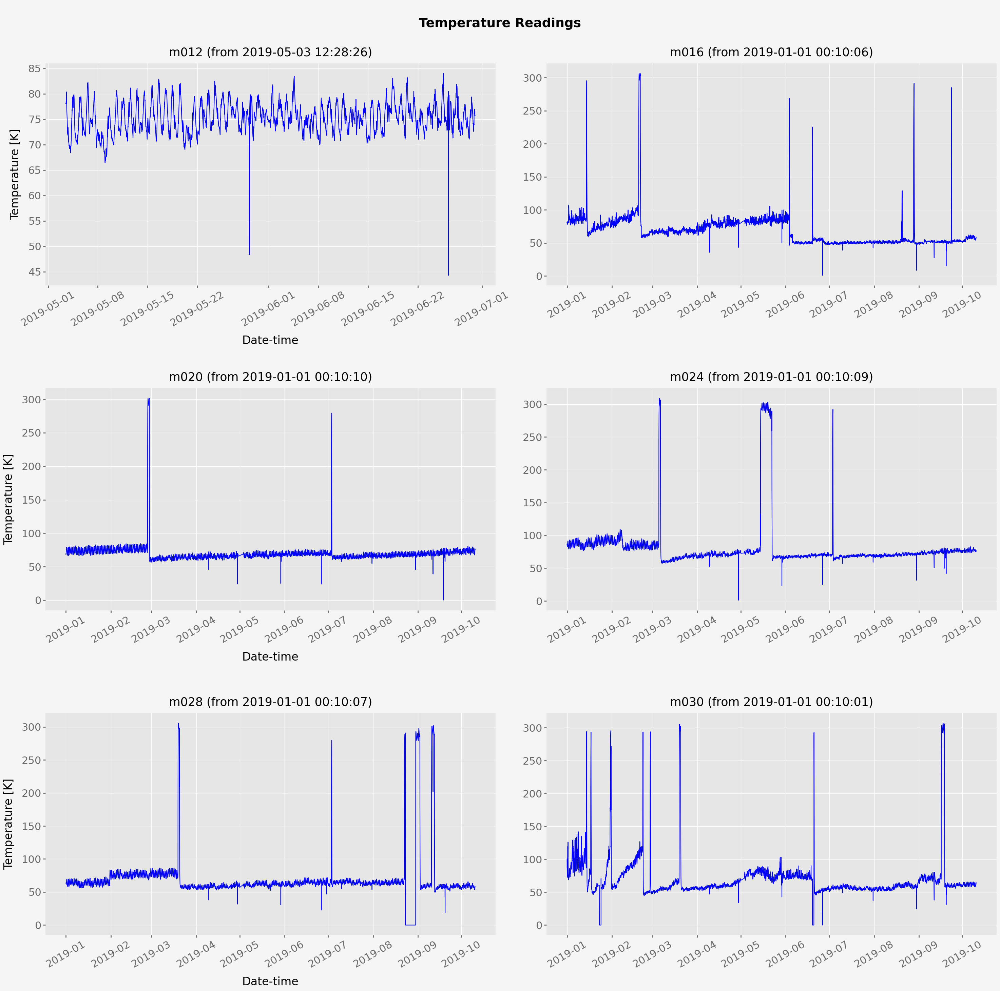

In [6]:
#--Visualizing the Dataset 
axs = tempPlot_all.plotData(is_dateTime_axis=True)

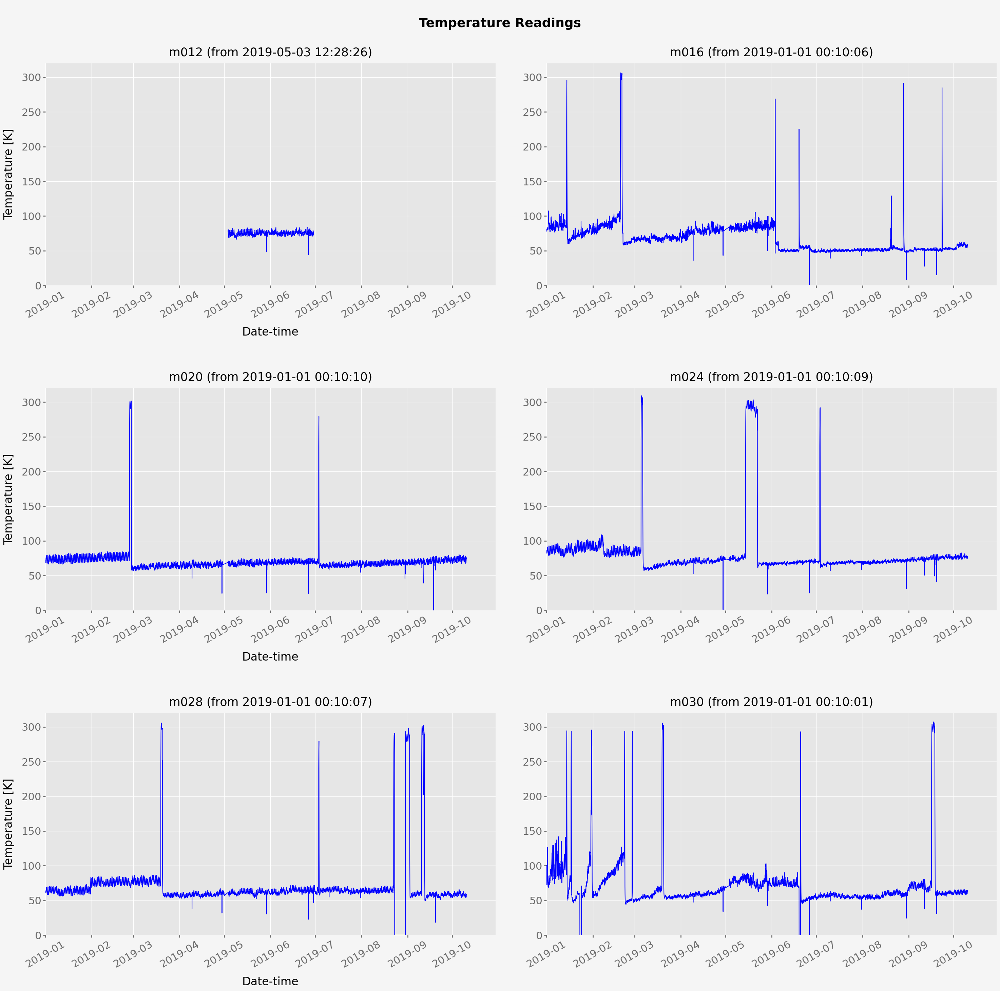

In [7]:
#--Visualizing the Dataset (with date-time axis)
axs = tempPlot_all.plotData(is_dateTime_axis=True)  
 
#Adjusting the plot views to the same bounds
tempPlot_all.adjust_plot_view(xMin='2019-01-01 00:00:00', xMax='2019-10-30 00:00:00', yMin=0, yMax=320)

In [8]:
class DistributionData(Enum):
    outliers = 'outliers'
    anomalous_data_points = 'anomalous_data_points'
    windowed_data = 'windowed_data'


class OutlierDetection:
    def __init__(self, data_for_detection:pd.DataFrame=pd.DataFrame(), ref_data_start_elapsed_time=None, ref_data_end_elapsed_time=None):    
        self.__frm_elpsd_time_init = None   #start of the reference dataset (__ref_data)
        self.__to_elpsd_time_init = None    #end of the reference dataset (__ref_data)
        self.__time_delta:int = None    #time step used in dataset
        self.__time_unit:str = None
        self.__window_size:int = None
        self.__m_data:pd.DataFrame = data_for_detection.copy()   
        self.__windowed_data:pd.DataFrame = pd.DataFrame() #holds the segmentation of the dataset with using a fixed window size
        self.__ref_data = pd.DataFrame()    #section of self.__m_data used to create the __ref_vals_df; it has anomalies removed and substituted for by either averages of sub-index values or an interpolation method (linear)
                
        #mean factor is used with the mean of the ref_vals to determine the lower and upper bounds for the mean 
        # feature of the dataset; these bounds are used to adjust the outlier boundaries for the dataset. The 
        # std factors are used with scaled ref_vals to determine the lower and upper bounds for the std 
        # feature of the dataset. (The scaled ref_vals are obtained using the adjusted outlier boundaries 
        # corresponding to the subsequences in the ref_vals.)
        self.__threshold_factors:dict = {'mean':1, 'std':[0.1, 1]} 

        #The lower and upper mean thresholds are of the same distance below and above the mean of the 
        # ref_vals, respectively. There is an upper limit for the upper std threshold, and this is the same as the std 
        # of the scaled ref_vals.
        self.__thresholds:dict = {'mean':[0,0], 'std':[0,0]}    #lower and upper threshold of the training data features (mean and std) used to categorize the data segments into normal and anomalous classes
        self.__ref_vals_df:pd.DataFrame = pd.DataFrame() #contains values corresponding to subindices of one period of the model of the dataset's seasonality 
        self.__bp_data:list = [] #contains data to generate boxplots of entire dataset with outermost outliers removed successively
        self.__completeInit(ref_frm_elpsd_time=ref_data_start_elapsed_time, ref_to_elpsd_time=ref_data_end_elapsed_time)


    def __completeInit(self, ref_frm_elpsd_time, ref_to_elpsd_time):
        self.__time_delta = int(self.__m_data.Elapsed_Time[1] - self.__m_data.Elapsed_Time[0])
        self.__time_unit = time_units[self.__m_data.index.freqstr[-1]]
        self.__m_data['is_outlier'] = [int(0) for _ in range(len(self.__m_data))]
        self.__m_data['is_anomalous'] = [int(0) for _ in range(len(self.__m_data))] 
        self.__create_ref_data(frm_elpsd_time=ref_frm_elpsd_time, to_elpsd_time=ref_to_elpsd_time)
        self.__remove_outliers_in_ref_data()
        self.__replace_outliers_in_ref_data()
        self.__determine_outliers_in_dataset()  

    
    def __create_ref_data(self, frm_elpsd_time=None, to_elpsd_time=None):
        startDtTm = closest_dateTime_to(frm_elpsd_time, self.__m_data) 
        endDtTm = closest_dateTime_to(to_elpsd_time, self.__m_data)
        self.__frm_elpsd_time_init = startDtTm
        self.__to_elpsd_time_init = endDtTm
        self.__ref_data = (self.__m_data[self.__frm_elpsd_time_init:self.__to_elpsd_time_init]).copy()
        self.__ref_data.rename(columns={'is_outlier':'was_outlier'}, inplace = True) 
        self.__ref_data.drop(columns=['is_anomalous'], axis=1, inplace=True)  


    def __find_outlier(self, in_data):       
        def find_outliers_in_data(data):     
            data = np.array(data)
            q1 = np.quantile(data, 0.25) 
            q3 = np.quantile(data, 0.75)
            iqr = q3-q1
            upper_bound = q3+(1.5*iqr)
            lower_bound = q1-(1.5*iqr)
            lower_outlrs = data[(data < lower_bound)] 
            upper_outlrs = data[(data > upper_bound)]  
            return [lower_bound, upper_bound], [lower_outlrs, upper_outlrs]
        
        bounds, outlrs = find_outliers_in_data(data=in_data)  
        min_outlr = None; max_outlr = None; outlr = None  
        if not(len(outlrs[0])==0):
            min_outlr = outlrs[0].min()
        if not(len(outlrs[1])==0):
            max_outlr = outlrs[1].max()
        
        if not(min_outlr==None) and not(max_outlr==None):
            if (min(bounds)-min_outlr) > (max_outlr-max(bounds)):
                outlr = min_outlr
            else:
                outlr = max_outlr
        elif not(min_outlr==None):
            outlr = min_outlr; 
        elif not(max_outlr==None):
            outlr = max_outlr
        return outlr

    
    def __remove_outliers_in_ref_data(self): 
        print("\nLOCATING OUTLIERS IN Reference dataset... waiting for last iteration")
        find_next_outlr = True; cnt = 0; 
        self.__bp_data = [] 

        while find_next_outlr: 
            data_without_outliers = self.__ref_data[self.__ref_data.was_outlier == 0]
            outlr = self.__find_outlier(in_data=data_without_outliers.Value.tolist()) 
            cnt += 1            
            if outlr != None:
                self.__bp_data.append(data_without_outliers.Value.tolist())
                dta_with_outliers = self.__ref_data[self.__ref_data.Value == outlr]
                for j in dta_with_outliers.Elapsed_Time.tolist():
                    self.__ref_data.loc[self.__ref_data.Elapsed_Time==j, 'was_outlier'] = int(1)                
            else:
                find_next_outlr = False
                if len(self.__bp_data)>0:
                    self.__bp_data.append(data_without_outliers.Value.tolist())
                print(f"Last Iteration is {cnt}")
        
        if len(self.__bp_data)==0:  
            print("No outliers found in dataset.")
        else:
            print("\nREMOVING OUTLIER VALUES IN Reference dataset...")
            self.__ref_data.loc[self.__ref_data.was_outlier==1, 'Value'] = np.NaN
            print("Finished removing outlier(s) in Reference dataset")  

    
    def __replace_outliers_in_ref_data(self): 
        ref_data_outlrs = self.__ref_data[self.__ref_data.was_outlier==1]
        if len(ref_data_outlrs) > 0:
            print("\nREPLACING OUTLIER VALUES IN Reference dataset...")
            ref_data_Val = self.__ref_data.Value.interpolate(method ='linear', limit_direction ='both')
            self.__ref_data.Value = ref_data_Val
            print(f"Outlier value(s) in Reference dataset replaced")
        else:
            print("\nNo outlier present in Reference dataset")    


    def __prep_boxplots(self): 
        fg = plt.figure(figsize=(20, 20))
        ax = fg.add_axes([0,0,1,1])
        format_ax(ax)
        return ax


    def __determine_outliers_in_dataset(self):  
        print("\nLOCATING OUTLIERS IN DATASET...")
        lwr_limit = min(self.__ref_data.Value)   
        upr_limit = max(self.__ref_data.Value)   
                
        m_dt_ls_grt:pd.DataFrame = pd.DataFrame()
        for i in [0,1]:
            if i==0: m_dt_ls_grt = self.__m_data[self.__m_data.Value < lwr_limit]
            else: m_dt_ls_grt = self.__m_data[self.__m_data.Value > upr_limit]
            
            for j in m_dt_ls_grt.Elapsed_Time.tolist():
                self.__m_data.loc[self.__m_data.Elapsed_Time==j, 'is_outlier'] = int(1)

        print("Finished locating outliers in dataset")


    def __create_windowed_data(self):   
        print("\nCREATING windowed data...")
        win_sz = self.__window_size
        minVl = (self.__m_data.Elapsed_Time[0])
        nrws = math.trunc((self.__m_data.Elapsed_Time[-1] - minVl)/win_sz) + 1
        winStartVals=[]; for_index=[]
        wnLag = int(win_sz/self.__time_delta)

        for j in range(int(nrws)):
            winStartVals.append(minVl+(win_sz*j))
            for_index.append(self.__m_data.index[j*wnLag])

        windowed_data = pd.DataFrame({'Date_Time':for_index, 'window_start':winStartVals})
        windowed_data.set_index('Date_Time', inplace=True)     
        windowed_data.sort_index(ascending=True, inplace=True)
        self.__windowed_data = windowed_data
        print("Windowed data created")
        self.__create_ref_vals()


    def __create_ref_vals(self, poly_deg:int=0, use_avg:bool=False): 
        if self.__windowed_data.empty:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        else:
            print("\nCREATING Reference Values...")
            #Extracting all refernce datapoints within complete time-windows
            for_rf_vals_df = self.__windowed_data[self.__windowed_data.window_start>=self.__ref_data.Elapsed_Time[0]]
            for_rf_vals_df = for_rf_vals_df[for_rf_vals_df.window_start<=self.__ref_data.Elapsed_Time[-1]]
            data_for_rf_vals = self.__ref_data[self.__ref_data.Elapsed_Time>=for_rf_vals_df.window_start[0]]
            data_for_rf_vals = data_for_rf_vals[data_for_rf_vals.Elapsed_Time<for_rf_vals_df.window_start[-1]]  
            
            rf_vals_len = int(self.__window_size/self.__time_delta)
            sub_ndcs = [x for x in range(rf_vals_len)]

            if use_avg:
                #------------Using averages of subsequences to Model the Seasonality-----------
                ref_vals_df_len = int(len(data_for_rf_vals)/rf_vals_len)    #number of time-windows in the dataset (data_for_rf_vals) used for the reference values
                sub_ndcs_sum = [0 for _ in range(rf_vals_len)]
                
                for j in range(rf_vals_len):    
                    dta_j = [data_for_rf_vals.Value[x*rf_vals_len + j] for x in range(ref_vals_df_len)]
                    sub_ndcs_sum[j] = sum(dta_j)
                
                rf_vals = [sub_ndcs_sum[x]/ref_vals_df_len for x in range(len(sub_ndcs_sum))] 
            else:
                #--------------Modeling the seasonality with a polynomial---------------------- 
                X = [j%rf_vals_len for j in range(len(data_for_rf_vals))]    #populates subsequence indices of all refernce datapoints within complete time-windows
                Y = data_for_rf_vals.Value.tolist()    #values of datapoints corresponding to the subindices in X
                dgr = int(poly_deg)
                
                if poly_deg<2: dgr = 0
                cff = list(np.polyfit(x=X, y=Y, deg=dgr))
                
                rf_vals = list()
                for j in range(rf_vals_len):
                    vl = 0
                    for d in range(dgr+1): 
                        vl += ((sub_ndcs[j])**(dgr-d))*cff[d]
                    rf_vals.append(vl)

            self.__ref_vals_df = pd.DataFrame()
            self.__ref_vals_df['sub_index'] = sub_ndcs
            self.__ref_vals_df['Value'] = rf_vals
            print("Reference Values created")
            self.__set_thresholds()
    
    
    def __set_thresholds(self):
        if not(self.__ref_vals_df.empty):
            print("\nSETTING THRESHOLD VALUES...")
            rf_vals_df = self.__ref_vals_df               
            d_1 = max(self.__ref_data.Value.values) - stts.mean(rf_vals_df.Value.values)  
            d_2 = stts.mean(rf_vals_df.Value.values) - min(self.__ref_data.Value.values)  
            max_d = max(d_1, d_2)
            k = max_d * self.__threshold_factors['mean']  #distance of threshold means from mean of ref_vals
            self.__ref_vals_df['l_bound'] = [(rf_vals_df.Value[x] - k) for x in range(len(rf_vals_df))] 
            self.__ref_vals_df['u_bound'] = [(rf_vals_df.Value[x] + k) for x in range(len(rf_vals_df))] 
            self.__thresholds['mean'][0] = stts.mean(self.__ref_vals_df.l_bound)
            self.__thresholds['mean'][1] = stts.mean(self.__ref_vals_df.u_bound)

            self.__ref_vals_df['scaled_Val'] = self.__compute_scaled_ref_vals()
            self.__thresholds['std'][0] = self.__threshold_factors['std'][0] * stts.stdev(self.__ref_vals_df.scaled_Val)
            self.__thresholds['std'][1] = self.__threshold_factors['std'][1] * stts.stdev(self.__ref_vals_df.scaled_Val)
            print("Finished setting threshold values")
            self.__determine_anomalous_data_in_dataset()
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message

    
    def __compute_scaled_ref_vals(self)->pd.Series:  
        #Scaling the refVals to obtain values to compute the upper threshold of std feature
        rfVls = self.__ref_vals_df;     fx = []
        a = min(rfVls.l_bound);         b = max(rfVls.u_bound)
        f_mn = min(rfVls.Value);        f_mx = max(rfVls.Value)

        if f_mn==f_mx: #-----Special case of horizontal linear model of seasonality
            x = rfVls.sub_index;    N = x.size
            if math.fmod(N,2)>0:
                x_md = x[1+int(N/2)]    
            else:
                x_md = x[int(N/2)]

            l1 = x_md;    l2 = N - l1
            fx = np.linspace(a,b,l1).tolist()
            fx = [round(fx[j],5) for j in range(len(fx))]
            fx = fx[:l1] + (np.linspace(b,a,l2+1).tolist())[1:]
            fx = pd.Series([round(fx[j],5) for j in range(len(fx))])
            f_mn = min(fx)
            f_mx = max(fx)
        else:
            fx = rfVls.Value
        
        fx2 = (fx - f_mn) * ((b-a)/(f_mx-f_mn)) + a
        return fx2    


    def __determine_anomalous_data_in_dataset(self):  
        print("\nLOCATING ANOMALOUS DATA POINTS IN DATASET...")
        m_data_elpsdTms = self.__m_data.Elapsed_Time.tolist()
        m_data_elpsdTm_0 = m_data_elpsdTms[0]
        lwr_limits = self.__ref_vals_df.l_bound.tolist()
        upr_limits = self.__ref_vals_df.u_bound.tolist() 

        for j in m_data_elpsdTms:
            elpsdTm_xcess = math.fmod(j-m_data_elpsdTm_0, self.__window_size)
            elpsdTm_sub_ndx = int(elpsdTm_xcess/self.__time_delta)
            l_limit = lwr_limits[elpsdTm_sub_ndx]     
            u_limit = upr_limits[elpsdTm_sub_ndx]                          
            dataVal_ndx = int((j-m_data_elpsdTm_0)/self.__time_delta)
            dataVal = self.__m_data.Value[dataVal_ndx]

            if dataVal<l_limit or dataVal>u_limit:
                self.__m_data.loc[self.__m_data.Elapsed_Time==j, 'is_anomalous'] = int(1)
            else:
                self.__m_data.loc[self.__m_data.Elapsed_Time==j, 'is_anomalous'] = int(0)
        print("Finished locating anomalous data points in dataset")
        self.__determine_anomaly_status_of_dataset_segments()


    def __get_forward_rlng_means_stds(self, dta:pd.Series)->list:   
        wnLag = int(self.__window_size/self.__time_delta)
        dta_means = dta.rolling(window=wnLag, center=False).mean()
        dta_means = dta_means[dta_means.notnull()].values
        dta_means = [round(dta_means[x], 5) for x in range(len(dta_means))]
        dta_stds = dta.rolling(window=wnLag, center=False).std()
        dta_stds = dta_stds[dta_stds.notnull()].values
        dta_stds = [round(dta_stds[x], 5) for x in range(len(dta_stds))]

        if dta.size>len(dta_means):
            rmainder = [np.nan for _ in range(dta.size-len(dta_means))]
            dta_means = dta_means + rmainder
            dta_stds = dta_stds + rmainder
        return dta_means, dta_stds 


    def __determine_anomaly_status_of_dataset_segments(self):
        def compute_for_anomalies_in(dt:pd.DataFrame)->list:
            mn_mean = self.__thresholds['mean'][0];    
            mx_mean = self.__thresholds['mean'][1]
            mn_std = self.__thresholds['std'][0];    
            mx_std = self.__thresholds['std'][1]
            m_dt = dt[dt.ftr_mean.notnull()].copy()
            
            for j in range(m_dt.index.size):
                if m_dt.ftr_mean[j] > mn_mean and m_dt.ftr_mean[j] < mx_mean and m_dt.ftr_std[j] > mn_std and m_dt.ftr_std[j] < mx_std:
                    m_dt.loc[m_dt.index==m_dt.index[j], 'is_anomalous_seg_start'] = int(0)    
                else: m_dt.loc[m_dt.index==m_dt.index[j], 'is_anomalous_seg_start'] = int(1)  
            
            m_rslt = m_dt.is_anomalous_seg_start.tolist()
            if dt.index.size>m_dt.index.size:
                rmainder = [np.nan for _ in range(dt.index.size-m_dt.index.size)]
                m_rslt = m_rslt + rmainder
            return m_rslt

        print("\nDETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...")
        m_means, m_stds = self.__get_forward_rlng_means_stds(self.__m_data.Value)
        self.__m_data['ftr_mean'] = m_means
        self.__m_data['ftr_std'] = m_stds
        self.__m_data['is_anomalous_seg_start'] = [np.nan for _ in range(len(self.__m_data))] 
        self.__m_data['is_anomalous_seg_start'] = compute_for_anomalies_in((self.__m_data[['ftr_mean', 'ftr_std']]))      
        print("Finished determining anomaly status of dataset segments")


    def create_windowed_data(self, with_window_size:int|float):
        if (type(with_window_size==int) or type(with_window_size==float)) and (with_window_size >= self.__time_delta):            
            self.__window_size = self.__time_delta * int(with_window_size/self.__time_delta)
            self.__create_windowed_data()
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"The time window size is invalid. Provide an 'int' or 'float' type value that is at least {self.__time_delta} {self.__time_unit}(s) or a multiple of {self.__time_delta} {self.__time_unit}(s).\n") #Error Message

    
    #Modeling Seasonality of the Dataset Using the Reference Data (without outliers)
    def model_seasonality(self, using_deg:int=0, plot_scatter:bool=True, plot_line:bool=False, show_range:dict={'from_cycle':0, 'num_of_cycles':1}, show_points_superimposed:bool=False): 
        if self.__windowed_data.empty:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        elif using_deg<2 and (using_deg != 0):
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid argument. Provide an integer greater than or equal to two for the degree of polynomial.\n") #Error Message
        else:
            for_rf_vals_df = self.__windowed_data[self.__windowed_data.window_start>=self.__ref_data.Elapsed_Time[0]]
            for_rf_vals_df = for_rf_vals_df[for_rf_vals_df.window_start<=self.__ref_data.Elapsed_Time[-1]]
            data_for_rf_vals = self.__ref_data[self.__ref_data.Elapsed_Time>=for_rf_vals_df.window_start[0]]
            data_for_rf_vals = data_for_rf_vals[data_for_rf_vals.Elapsed_Time<for_rf_vals_df.window_start[-1]]  
            
            rf_vals_len = int(self.__window_size/self.__time_delta)
            dta_ndx_strt = len(self.__m_data[self.__m_data.Elapsed_Time<=data_for_rf_vals.Elapsed_Time[0]]) - 1
            
            X = [(dta_ndx_strt + j) for j in range(len(data_for_rf_vals))]
            Y = data_for_rf_vals.Value.tolist() 
            dgr = int(using_deg) 
            X_samples = [j%rf_vals_len for j in range(len(X))]   #populates subsequence indices of all refernce datapoints within complete time-windows
            cff = list(np.polyfit(x=X_samples, y=Y, deg=dgr))
            
            y = list()              #functional values
            for j in range(len(X)):
                x = j%rf_vals_len
                vl = 0  
                for d in range(dgr+1): 
                    vl += ((x)**(dgr-d))*cff[d]
                y.append(vl)

            ax:plt.Axes = None 
            if show_points_superimposed:
                ax = get_plot_ax()
                ax.figure.set_size_inches(10,7)
                ax.plot(X_samples, Y, color='tab:blue', ls='none', marker='o', ms=3, label='data point')
                ax.plot(list(range(rf_vals_len)), y[0:rf_vals_len], lw=3, color='r', label='seasonal cycle')
                ax.set_title(f"\nModeling Seasonality of Dataset Using Reference\nDataset and a Polynomial of degree {using_deg}", fontsize=20)
                ax.set_xlabel('Data Sub-index')
                ax.set_ylabel('Temperature [K]')
                ax.legend()
            else:
                m=show_range['from_cycle'];  n =show_range['num_of_cycles']
                if m==None: m=int(0)
                if n==None: n=int(len(data_for_rf_vals)/rf_vals_len)
                
                fr_mx_len = self.__windowed_data[self.__windowed_data.window_start >= self.__ref_data.Elapsed_Time[0]]
                fr_mx_len = fr_mx_len[fr_mx_len.window_start <= self.__ref_data.Elapsed_Time[-1]]
                mx_len = len(fr_mx_len)
                m_max = mx_len - 1
                n_max = None

                if m != None and (type(m)==float or type(m)==int):
                    m = int(m)
                    if len(self.__m_data[self.__m_data.Elapsed_Time >= self.__windowed_data.window_start[-1]]) != self.__time_delta:
                        m_max = m_max-1
                    n_max = m_max - m + 1

                    if m<0:
                        m=None; n_max=None
                        print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid argument. Enter a positive integer for the 'from_cycle' key of the show_range parameter.\n") #Error Message
                    elif m>m_max: 
                        m=m_max; n_max=1   
                else:
                    print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid argument. Enter a positive integer for the 'from_cycle' key of the show_range parameter.\n") #Error Message
                
                if n != None and (type(n)==float or type(n)==int):
                    n = int(n)
                    if n<1:
                        n = None
                        print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid argument. Enter a positive integer greater than or equal to 1 for the 'num_of_cycles' key of the show_range parameter.\n")
                    elif n_max != None and n>n_max:
                        n = n_max
                
                if m != None and n != None:
                    ax = get_plot_ax() 
                    if n == 1: ax.figure.set_size_inches(10,7)
                    elif n <= 5: ax.figure.set_size_inches(n*5,7)
                    ax.set_title(f"\nModel of Seasonality starting from cycle {m} and spanning\n{n} cylcle(s) within the Reference Dataset", fontsize=20)
                    ax.set_xlabel('Data Index')
                    ax.set_ylabel('Temperature [K]')

                    if plot_scatter:
                        _ = ax.scatter(X, Y, label='reference data')
                    elif plot_line:
                        _ = ax.plot(X, Y, label='reference data')
                    
                    _ = ax.plot(X, y, color='r', lw=3, label='seasonality\n(reference values)')
                    ax.legend()
                    adjust_plot_view(ax=ax, xMin=(dta_ndx_strt + m*rf_vals_len), xMax=(dta_ndx_strt + (m+n)*rf_vals_len)-1)
            return ax


    def model_dataset(self, using_polynomial_degree:int=0, use_subsequence_average:bool=False):
        self.__create_ref_vals(poly_deg=using_polynomial_degree, use_avg=use_subsequence_average)


    def adjust_threshold_factors(self, mean_factor:float|int=None, std_factor_lower:float|int=None, std_factor_upper:float|int=None):
        mn_fctr=None; std_fctr_lwr=None; std_fctr_upr=None
        if type(mean_factor)==float or type(mean_factor)==int:
            mn_fctr = mean_factor
        elif mean_factor == None:
            mn_fctr = self.__threshold_factors['mean']
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factor. Provide a number that is greater than or equal to 1 for the 'mean_factor' argument.\n") #Error Message

        if type(std_factor_lower)==float or type(std_factor_lower)==int:
            std_fctr_lwr = std_factor_lower
        elif std_factor_lower == None:
            std_fctr_lwr = self.__threshold_factors['std'][0]
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factor. Provide a number that is between 0 and 1 for the 'std_factor_lower' argument.\n") #Error Message
    
        if type(std_factor_upper)==float or type(std_factor_upper)==int:
            std_fctr_upr = std_factor_upper
        elif std_factor_upper == None:
            std_fctr_upr = self.__threshold_factors['std'][1]
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factor. Provide a number that is between 0 and 1 for the 'std_factor_upper' argument.\n") #Error Message
    
        if mn_fctr != None and mn_fctr<1: 
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factor. Provide a positive number greater than or equal to 1 for the 'mean_factor' argument.\n") #Error Message
        elif std_fctr_lwr != None and std_fctr_upr != None and std_fctr_lwr>=std_fctr_upr:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factors. Provide a 'std_factor_lower' value that is less than that of std_factor_upper.\n") #Error Message
        elif std_fctr_lwr != None and std_fctr_upr != None and (std_fctr_lwr<0 or std_fctr_lwr>1 or std_fctr_upr<0 or std_fctr_upr>1):
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Invalid threshold factors. Provide values between 0 and 1 for the 'std_factor_lower' and std_factor_upper arguments.\n") #Error Message
        elif mn_fctr != None and std_fctr_lwr != None and std_fctr_upr != None:
            self.__threshold_factors = {
                'mean':mn_fctr,
                'std':[std_fctr_lwr, std_fctr_upr]
            }
            self.__set_thresholds()


    def get_time_unit(self):
            return self.__time_unit

    def get_threshold_factors(self):
        return self.__threshold_factors.copy()
    
    def get_thresholds(self):
        return self.__thresholds.copy()
    
    def get_outlr_limits(self):
        return [min(self.__ref_data.Value), max(self.__ref_data.Value)]
    
    def get_reference_data(self):
        return self.__ref_data.copy()
        
    def get_reference_vals(self):
        if self.__windowed_data.empty:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        else:
            return self.__ref_vals_df.copy()
        
    def get_windowed_data(self):
        if self.__windowed_data.empty:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        else:
            return self.__windowed_data.copy()
    
    def get_original_data(self):
        return self.__m_data.copy()

    def get_time_delta(self):
        return self.__time_delta

    def get_time_window_size(self):
        if self.__window_size==None:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        else:
            return self.__window_size
        

    def get_boxplot_data(self):
        if len(self.__bp_data)==0:
            self.__remove_outliers_in_ref_data()
        return self.__bp_data.copy()    
    

    def get_outliers(self)->pd.DataFrame:
        outlrs_data:pd.DataFrame = self.__m_data[self.__m_data.is_outlier==1]
        return outlrs_data.copy()
    
    def get_anomalous_data(self)->pd.DataFrame:
        anmls_data:pd.DataFrame = self.__m_data[self.__m_data.is_anomalous==1]
        return anmls_data.copy()


    def plot_boxplots(self, start_ndx=0, end_ndx = -1, step_sz=1, minY=None, maxY=None):
        ndx_1=start_ndx; ndx_2=end_ndx
        if len(self.__bp_data)==0:
            self.__remove_outliers_in_ref_data()            

        if len(self.__bp_data) > 0:
            max_ndx = len(self.__bp_data)
            if ndx_1<0:
                ndx_1 = max_ndx + ndx_1
            if ndx_2<0:
                ndx_2 = max_ndx + ndx_2 + 1 

            if (ndx_1 < ndx_2) and (ndx_1 < max_ndx) and step_sz >= 1: 
                ax:plt.Axes = self.__prep_boxplots()
                ax.figure.set_size_inches(20,7.5)
                ax.set_title(' ')    
                ax.set_xlabel('Iteration')    
                ax.set_ylabel('Temperature [K]')    
                if minY != None:
                    ax.set_ylim(bottom=minY)
                if maxY != None:
                    ax.set_ylim(top=maxY)
                xtcklbls = [f"{x+1}" for x in range(ndx_1, max_ndx, step_sz)]
                bpDt = self.__bp_data[ndx_1:ndx_2:step_sz]
                _ = ax.boxplot(bpDt, showmeans=True)
                ticks_loc = [(x+1) for x in range(len(xtcklbls))]  
                ax.xaxis.set_major_locator(mticker.FixedLocator(locs=ticks_loc, nbins=len(ticks_loc)))
                ax.set_xticklabels(xtcklbls)
                return ax
            elif ndx_1 >= max_ndx:
                print(Fore.RED+"\nError! "+Fore.GREEN+"Invalid arguments. Index out of range.\n")    #Error Message
                return None
            elif ndx_1>=ndx_2:
                print(Fore.RED+"\nError! "+Fore.GREEN+"Invalid arguments. start_ndx should be less than end_ndx.\n")    #Error Message
                return None
            else:
                print(Fore.RED+"\nError! "+Fore.GREEN+"Invalid arguments. step_sz should be greater than or equal to 1.\n")    #Error Message
                return None
        else:
            print(Fore.GREEN+"No box plot data available. The initial reference dataset did not have any outliers.\n")    #Error Message
            return None


    def plot_data(self, on_ax:plt.Axes, is_dateTime_axis:bool=False):
        on_ax.set_ylabel('Temperature [K]')
        if is_dateTime_axis:
            on_ax.set_xlabel('Date-time')
            on_ax.plot(self.__m_data.index, self.__m_data.Value, marker='', linestyle='-', color='b', label='original data')
        else:
            on_ax.set_xlabel(xlabel='Elapsed Time [min]')   
            on_ax.plot(self.__m_data.Elapsed_Time, self.__m_data.Value, marker='', linestyle='-', color='b', label='original data')


    def plot_reference_values(self, on_ax:plt.Axes, is_dateTime_axis=False, plot_color='darkgreen'):
        #Plotting the reference value for the sub-indices of the dataset
        rfVals_0 = self.get_reference_vals().Value.tolist()        
        rfVal_len = len(rfVals_0)
        rfVals = [rfVals_0[(j%rfVal_len)] for j in range(len(self.__m_data))]

        rfWin_Tm = list()
        if is_dateTime_axis:
            rfWin_Tm = self.__m_data.index.tolist()[:len(rfVals)]
        else:
            rfWin_Tm = self.__m_data.Elapsed_Time.tolist()[:len(rfVals)]
        _ = on_ax.plot(rfWin_Tm, rfVals, color=plot_color, ls='-', lw=2, label='reference values')


    def plot_normal_data_bounds(self, on_ax:plt.Axes, is_dateTime_axis:bool=False, plot_color='olive', fill_alpha:float=0.15):
        rfVal_l_bound_0 = self.get_reference_vals().l_bound.tolist()
        rfVal_l_bound = []
        rfVal_u_bound_0 = self.get_reference_vals().u_bound.tolist()
        rfVal_u_bound = []
        rfVal_len = len(rfVal_l_bound_0)
        rfVal_l_bound = [rfVal_l_bound_0[(j%rfVal_len)] for j in range(len(self.__m_data))]
        rfVal_u_bound = [rfVal_u_bound_0[(j%rfVal_len)] for j in range(len(self.__m_data))]
        rfVal_Tm = list()

        if is_dateTime_axis:
            rfVal_Tm = self.__m_data.index.tolist()
        else:
            rfVal_Tm = self.__m_data.Elapsed_Time.tolist()
        _ = on_ax.plot(rfVal_Tm, rfVal_u_bound, color=plot_color, ls='-', lw=2, label='normal data\nupper bound') #'outlier upper bound'
        _ = on_ax.plot(rfVal_Tm, rfVal_l_bound, color=plot_color, ls='--', lw=2, label='normal data\nlower bound')   #'outlier lower bound'        
        _ = on_ax.fill_between(x=rfVal_Tm, y1=rfVal_l_bound, y2=rfVal_u_bound, color=plot_color, alpha=fill_alpha, label='normal data') #'non-outliers'


    def plot_outliers_limits(self, on_ax:plt.Axes, is_dateTime_axis:bool=False, plot_color='k'):
        xMn = self.__m_data.Elapsed_Time[0]
        xMx = self.__m_data.Elapsed_Time[-1]
        
        if is_dateTime_axis:
            xMn = self.__m_data.index[0]
            xMx = self.__m_data.index[-1]
        
        _ = on_ax.hlines(
            y=max(self.__ref_data.Value), 
            xmin=xMn, 
            xmax=xMx,
            linestyles={'dashdot'},
            colors=[plot_color],
            label='outlier \nupper limit'
        )
        
        _ = on_ax.hlines(
            y=min(self.__ref_data.Value), 
            xmin=xMn, 
            xmax=xMx,
            linestyles='dashed',
            colors=[plot_color],
            label='outlier \nlower limit'
        )


    def plot_outliers(self, on_ax:plt.Axes=None, is_dateTime_axis=False, plot_label:str='outlier'):        
        outlrs_data:pd.DataFrame = self.get_outliers()
        if not(outlrs_data.empty):
            if is_dateTime_axis:
                on_ax.plot(outlrs_data.index, outlrs_data.Value, marker='o', color='r', linestyle='', label=plot_label)
            else:
                on_ax.plot(outlrs_data.Elapsed_Time, outlrs_data.Value, marker='o', color='r', linestyle='', label=plot_label)
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Outliers could not be plotted: there are no outliers in the dataset.\n") #Error Message
                
    
    def plot_anomalous_data(self, on_ax:plt.Axes=None, is_dateTime_axis=False, plot_label:str='anomalous data'):
        anmls_data:pd.DataFrame = self.get_anomalous_data()
        if not(anmls_data.empty):
            if is_dateTime_axis:
                on_ax.plot(anmls_data.index, anmls_data.Value, marker='o', color='r', linestyle='', label=plot_label)
            else:
                on_ax.plot(anmls_data.Elapsed_Time, anmls_data.Value, marker='o', color='r', linestyle='', label=plot_label)
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"Anomalous data could not be plotted: there are no anomalous data points in the dataset.\n") #Error Message
           
     
    def show_windowed_data(self, on_ax:plt.Axes, from_elapsed_time=None, to_elapsed_time=None, is_dateTime_axis:bool=False, show_outliers:bool=False, show_anomalous_data:bool=False, show_counts:bool=False, anchor_to_end:bool=False, shift_by_lags:int=0):       
        if not(self.__windowed_data.empty):
            wnLag = int(self.__window_size/self.__time_delta)
            win_sz=self.__window_size; win_sz_half=(win_sz/2)   #
            n_data = self.__m_data             
            
            if from_elapsed_time != None: 
                n_data = n_data[n_data.Elapsed_Time >= from_elapsed_time]
            if to_elapsed_time != None: 
                n_data = n_data[n_data.Elapsed_Time <= to_elapsed_time]

            if not(n_data.empty):
                len_dt=len(n_data); winStartVals=[] 
                elpsdTms = n_data.Elapsed_Time.tolist()

                if anchor_to_end:
                    cnt=1;  
                    ndx = int(-cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                    while ndx>(-len_dt):
                        winStartVals = [elpsdTms[ndx]] + winStartVals
                        if winStartVals[0] <= n_data.Elapsed_Time[0]:
                            break
                        cnt += 1
                        ndx = int(-cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                else:                
                    cnt=0; 
                    ndx = int(cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                    while ndx<len_dt:
                        winStartVals.append(elpsdTms[ndx])
                        if winStartVals[-1] >= n_data.Elapsed_Time[-1]:
                            if winStartVals[-1] == n_data.Elapsed_Time[-1]:
                                winStartVals.pop()
                            break
                        cnt += 1
                        ndx = int(cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                
                n_data_hlt:pd.DataFrame = pd.DataFrame()
                n_data_hlt_bgn:pd.DataFrame = pd.DataFrame(); 
                n_data_hlt_end:pd.DataFrame = pd.DataFrame()
                
                if len(winStartVals)>0:
                    n_data_hlt = n_data[n_data.Elapsed_Time >= winStartVals[0]]  
                if (n_data.Elapsed_Time[-1] - winStartVals[-1]) != (self.__window_size-self.__time_delta): #check
                    n_data_hlt = n_data_hlt[n_data_hlt.Elapsed_Time < winStartVals[-1]]           
                if n_data.Elapsed_Time[0] < winStartVals[0]:
                    n_data_hlt_bgn = n_data[n_data.Elapsed_Time < winStartVals[0]]                    

                if not(n_data_hlt.empty):
                    n_data_hlt_end = n_data[n_data.Elapsed_Time > n_data_hlt.Elapsed_Time[-1]]
                else:
                    n_data_hlt_end = n_data[n_data.Elapsed_Time > winStartVals[-1]]
                
                winStartVals = [x for x in winStartVals if x in n_data_hlt.Elapsed_Time.tolist()]
                            
                if show_outliers:
                    self.plot_outliers(on_ax=on_ax, is_dateTime_axis=is_dateTime_axis)
                elif show_anomalous_data:
                    self.plot_anomalous_data(on_ax=on_ax, is_dateTime_axis=is_dateTime_axis)
                    
                clrStrs=['lightsteelblue', 'aliceblue']; clr_alpha=[0.75, 0.5]
                if not(n_data_hlt.empty):
                    hilite_plots(
                        on_ax=on_ax, for_data=self.__m_data, 
                        from_elapsed_time=n_data_hlt.Elapsed_Time[0], 
                        to_elapsed_time=n_data_hlt.Elapsed_Time[-1], 
                        is_dateTime_axis=is_dateTime_axis,
                        show_time_windows=True, 
                        win_size=self.__window_size, time_delta=self.__time_delta
                        #hlt_clrs=clrStrs, hlt_alpha=clr_alpha
                    ) 
                
                if not(n_data_hlt_bgn.empty):
                    hilite_plots(
                        on_ax=on_ax, for_data=self.__m_data, 
                        from_elapsed_time=n_data_hlt_bgn.Elapsed_Time[0], 
                        to_elapsed_time=n_data_hlt_bgn.Elapsed_Time[-1], 
                        show_time_windows=False, time_delta=self.__time_delta, 
                        is_dateTime_axis=is_dateTime_axis, 
                        hlt_clrs=[clrStrs[1]], hlt_alpha=[clr_alpha[1]]
                    ) 
                if not(n_data_hlt_end.empty):
                    fclr_ndx = len(winStartVals)%2
                    hilite_plots(
                        on_ax=on_ax, for_data=self.__m_data, 
                        from_elapsed_time=n_data_hlt_end.Elapsed_Time[0], 
                        to_elapsed_time=n_data_hlt_end.Elapsed_Time[-1], 
                        is_dateTime_axis=is_dateTime_axis,
                        show_time_windows=False, time_delta=self.__time_delta, 
                        hlt_clrs=[clrStrs[fclr_ndx]], 
                        hlt_alpha=[clr_alpha[fclr_ndx]]
                    )
            
                if is_dateTime_axis:
                    win_sz = timedelta(minutes=win_sz)
                    win_sz_half = timedelta(minutes=win_sz_half)

                maxVl = max(self.__m_data.Value)  
                minVl = min(self.__m_data.Value)
                htXtnd = 0.0075*(maxVl-minVl)

                if show_counts and (show_outliers or show_anomalous_data) and not(n_data_hlt.empty):
                    outlr_anmlsData_counts={}; outlr_anmlsData_count_txt_props = []
                    for t in winStartVals:
                        win_l_bound=None; win_start:int=0
                        fr_outlrs:pd.DataFrame = n_data[n_data.Elapsed_Time >= t]   
                        fr_outlrs = fr_outlrs[fr_outlrs.Elapsed_Time < (fr_outlrs.Elapsed_Time[0] + self.__window_size)]
                        
                        if is_dateTime_axis:
                            win_l_bound = fr_outlrs.index[0]
                        else:
                            win_l_bound = fr_outlrs.Elapsed_Time[0]
                        
                        win_start = fr_outlrs.Elapsed_Time[0]
                        if show_outliers:
                            outlr_anmlsData_counts[f'{win_start}'] = len(fr_outlrs[fr_outlrs.is_outlier==1])
                        else:
                            outlr_anmlsData_counts[f'{win_start}'] = len(fr_outlrs[fr_outlrs.is_anomalous==1])
                        
                        outlr_anmlsData_count_txt_props.append({
                            'x' : win_l_bound+win_sz_half,    
                            'y' : maxVl + 2*htXtnd, 
                            's' : f"{outlr_anmlsData_counts[f'{win_start}']}"
                        })

                    for txt_prp in outlr_anmlsData_count_txt_props:
                        txt_prp_x=txt_prp['x']; txt_prp_y=txt_prp['y']
                        on_ax.annotate(
                            txt_prp['s'], ha='center', va='bottom', size=15, weight='medium',
                            xy=(txt_prp_x, txt_prp_y), xycoords='data',
                            xytext=(0, 0), textcoords='offset points'
                        )
            else:
                print(Fore.RED+"\nError! "+Fore.GREEN+f"You have no data in the date-time limits provided. 'to_date_time' should be at least {win_sz} {self.__time_unit}(s) later than 'from_date_time', in comformity to the windowed data set.\n") #Error Message
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message


    def show_plots_in_window(self, on_ax:plt.Axes, from_elapsed_time=None, to_elapsed_time=None, is_dateTime_axis=False, show_outliers=False, show_anomalous_data:bool=False, show_counts=False):                 
        n_data:pd.DataFrame = self.__m_data 

        if from_elapsed_time != None: 
            n_data = n_data[n_data.Elapsed_Time >= from_elapsed_time]        
        if to_elapsed_time != None: 
            n_data = n_data[n_data.Elapsed_Time <= to_elapsed_time]

        if not(n_data.empty):
            if show_outliers:
                self.plot_outliers(on_ax=on_ax, is_dateTime_axis=is_dateTime_axis)
            elif show_anomalous_data:
                self.plot_anomalous_data(on_ax=on_ax, is_dateTime_axis=is_dateTime_axis)
            hilite_plots(
                on_ax=on_ax, for_data=self.__m_data, 
                from_elapsed_time=n_data.Elapsed_Time[0], 
                to_elapsed_time=n_data.Elapsed_Time[-1], 
                is_dateTime_axis=is_dateTime_axis,
                show_time_windows=False, 
                win_size=self.__window_size, time_delta=self.__time_delta
            )
            
            win_sz=self.__window_size; win_sz_half=(win_sz/2); mrgn=self.__time_delta/2
            strtTm=None; endTm=None; 
            if is_dateTime_axis:
                mrgn = timedelta(minutes=mrgn) 
                win_sz_half = timedelta(minutes=win_sz_half)
                strtTm = n_data.index[0] 
                endTm = n_data.index[-1] 
            else:
                strtTm = n_data.Elapsed_Time[0] 
                endTm = n_data.Elapsed_Time[-1] 
            strtTm = strtTm-mrgn; endTm = endTm+mrgn

            maxVl = max(self.__m_data.Value.values) 
            minVl = min(self.__m_data.Value.values) 
            htXtnd = 0.0075*(maxVl-minVl)
            
            if show_counts and (show_outliers or show_anomalous_data):
                outlr_anmlsData_counts = None
                if show_outliers:
                    outlr_anmlsData_counts = len(n_data[n_data.is_outlier==1])
                else:
                    outlr_anmlsData_counts = len(n_data[n_data.is_anomalous==1])
                txt_prp_x = strtTm+((endTm-strtTm)/2); txt_prp_y = maxVl + 2*htXtnd 

                on_ax.annotate(
                    f"{outlr_anmlsData_counts}", ha='center', va='bottom', size=15, weight='medium',
                    xy=(txt_prp_x, txt_prp_y), xycoords='data',
                    xytext=(0, 0), textcoords='offset points'
                )
        else:

            print(Fore.RED+"\nError! "+Fore.GREEN+f"You have no data in the date-time limits provided. 'to_elapsed_time' should be at least {self.__time_delta} {self.__time_unit}(s) later than 'from_elapsed_time', in comformity to the data set.\n") #Error Message


    def plot_class_distribution(self, on_ax:plt.Axes=None, for_data:DistributionData=DistributionData.windowed_data)->plt.Axes:
        if not(self.__windowed_data.empty):
            fg:fgr.Figure=None; ax:plt.Axes=None
            if on_ax==None: 
                ax = get_plot_ax() 
                fg = ax.figure
                fg.set_size_inches(8,6)
            else: 
                ax = on_ax
                fg = ax.figure

            pieChartData = []
            myLbls = [] 
            more_0s:bool = None
                            
            if for_data.value==DistributionData.anomalous_data_points.value:
                anmly_0 = len(self.__m_data[self.__m_data.is_anomalous==0])
                anmly_1 = len(self.__m_data[self.__m_data.is_anomalous==1])
                more_0s = anmly_0 > anmly_1
                if more_0s: 
                    pieChartData += [anmly_1, anmly_0]
                    myLbls = ['anomalous', 'normal']
                else: 
                    pieChartData += [anmly_0, anmly_1]
                    myLbls = ['normal', 'anomalous']
                ax.set_title(f"\nAnomaly Distribution of Data\n")
            elif for_data.value==DistributionData.outliers.value:
                outlr_0 = len(self.__m_data[self.__m_data.is_outlier==0])
                outlr_1 = len(self.__m_data[self.__m_data.is_outlier==1])
                more_0s = outlr_0 > outlr_1
                if more_0s: 
                    pieChartData += [outlr_1, outlr_0]
                    myLbls = ['outliers', 'non-outliers']
                else: 
                    pieChartData += [outlr_0, outlr_1]
                    myLbls = ['non-outliers', 'outliers']
                ax.set_title(f"\nOutlier Distribution of Data\n")
            else:
                sgmnt_0 = len(self.__m_data[self.__m_data.is_anomalous_seg_start==0])
                sgmnt_1 = len(self.__m_data[self.__m_data.is_anomalous_seg_start==1])
                more_0s = sgmnt_0 > sgmnt_1
                if more_0s: 
                    pieChartData += [sgmnt_1, sgmnt_0]
                    myLbls = ['anomalous', 'normal']
                else: 
                    pieChartData += [sgmnt_0, sgmnt_1]
                    myLbls = ['normal', 'anomalous']
                ax.set_title(f"\nAnomaly Distribution of Windowed Data\n")
            
            ax.axis('equal')  
            ax.pie( 
                pieChartData, 
                autopct='%1.1f%%', pctdistance=0.725, 
                colors=['tab:orange', 'tab:blue'],
                labels=myLbls, labeldistance=None,
                explode=(0, 0.075), 
                wedgeprops=dict(width=0.6, edgecolor=fg.get_facecolor(), linewidth=1),
                textprops=dict(color="w", font=dict(size=14, weight='semibold'))
                #radius=1
                #colors=colors,
            )
            _ = ax.legend()
            return ax 
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
            return None

    
    def show_anomalous_segments(self, on_ax:plt.Axes, is_dateTime_axis:bool=False, anchor_to_end:bool=False, shift_by_lags:int=0):  
        if not(self.__ref_data.empty):
            wnLag = int(self.__window_size/self.__time_delta)

            if not(self.__m_data[self.__m_data.is_anomalous_seg_start==1].empty):  
                anmly_strts = self.__m_data[self.__m_data.is_anomalous_seg_start==1].Elapsed_Time.tolist()
                anmly_sctns=[]; anmly_sctn_strts=[anmly_strts[0]]

                if len(anmly_strts)>1:
                    for j in range(len(anmly_strts) - 1):
                        if (anmly_strts[j+1] - anmly_strts[j])==self.__time_delta:
                            anmly_sctn_strts.append(anmly_strts[j+1])
                        else:
                            if (anmly_strts[j] + self.__window_size) < anmly_strts[j+1]:
                                anmly_sctns.append(anmly_sctn_strts)
                                anmly_sctn_strts = [anmly_strts[j+1]]
                            else:
                                anmly_sctn_strts.append(anmly_strts[j+1])
                        
                        if j==(len(anmly_strts) - 2):
                            anmly_sctns.append(anmly_sctn_strts)
                                
                    for sctn in anmly_sctns:
                        n_data = self.__m_data[self.__m_data.Elapsed_Time >= sctn[0]]
                        n_data = n_data[n_data.Elapsed_Time < (sctn[-1] + self.__window_size)]

                        len_dt=len(n_data); winStartVals=[] 
                        elpsdTms = n_data.Elapsed_Time.tolist()
            
                        if anchor_to_end:
                            cnt=1;  
                            ndx = int(-cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                            while ndx>(-len_dt):
                                winStartVals = [elpsdTms[ndx]] + winStartVals
                                if winStartVals[0] <= n_data.Elapsed_Time[0]:
                                    break
                                cnt += 1
                                ndx = int(-cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                        else:                
                            cnt=0; 
                            ndx = int(cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                            while ndx<len_dt:
                                winStartVals.append(elpsdTms[ndx])
                                if winStartVals[-1] >= n_data.Elapsed_Time[-1]:
                                    if winStartVals[-1] == n_data.Elapsed_Time[-1]:
                                        winStartVals.pop()
                                    break
                                cnt += 1
                                ndx = int(cnt*wnLag + math.fmod((math.fmod(int(shift_by_lags), wnLag) + wnLag), wnLag))
                            
                        n_data_hlt:pd.DataFrame = pd.DataFrame()
                        n_data_hlt_bgn:pd.DataFrame = pd.DataFrame(); 
                        n_data_hlt_end:pd.DataFrame = pd.DataFrame()
                        
                        if len(winStartVals)>0:
                            n_data_hlt = n_data[n_data.Elapsed_Time >= winStartVals[0]]  
                        if (n_data.Elapsed_Time[-1] - winStartVals[-1]) != (self.__window_size-self.__time_delta): #check
                            n_data_hlt = n_data_hlt[n_data_hlt.Elapsed_Time < winStartVals[-1]]           
                        if n_data.Elapsed_Time[0] < winStartVals[0]:
                            n_data_hlt_bgn = n_data[n_data.Elapsed_Time < winStartVals[0]]                    

                        if not(n_data_hlt.empty):
                            n_data_hlt_end = n_data[n_data.Elapsed_Time > n_data_hlt.Elapsed_Time[-1]]
                        else:
                            n_data_hlt_end = n_data[n_data.Elapsed_Time > winStartVals[-1]]

                        winStartVals = [x for x in winStartVals if x in n_data_hlt.Elapsed_Time.tolist()]                    
                        
                        clrStrs=['r', 'r']; clr_alpha = [0.25, 0.15]
                        if not(n_data_hlt.empty):
                            hilite_plots(
                                on_ax=on_ax, for_data=self.__m_data, 
                                from_elapsed_time=n_data_hlt.Elapsed_Time[0], 
                                to_elapsed_time=n_data_hlt.Elapsed_Time[-1], 
                                is_dateTime_axis=is_dateTime_axis,
                                show_time_windows=True, 
                                win_size=self.__window_size, time_delta=self.__time_delta, 
                                hlt_clrs=clrStrs, hlt_alpha=clr_alpha
                            ) 
                        if not(n_data_hlt_bgn.empty):
                            hilite_plots(
                                on_ax=on_ax, for_data=self.__m_data, 
                                from_elapsed_time=n_data_hlt_bgn.Elapsed_Time[0], 
                                to_elapsed_time=n_data_hlt_bgn.Elapsed_Time[-1], 
                                show_time_windows=False, time_delta=self.__time_delta, 
                                is_dateTime_axis=is_dateTime_axis, 
                                hlt_clrs=[clrStrs[1]], 
                                hlt_alpha=[clr_alpha[1]]    
                            ) 
                        if not(n_data_hlt_end.empty):
                            fclr_ndx = len(winStartVals)%2
                            hilite_plots(
                                on_ax=on_ax, for_data=self.__m_data, 
                                from_elapsed_time=n_data_hlt_end.Elapsed_Time[0], 
                                to_elapsed_time=n_data_hlt_end.Elapsed_Time[-1], 
                                is_dateTime_axis=is_dateTime_axis,
                                show_time_windows=False, time_delta=self.__time_delta, 
                                hlt_clrs=[clrStrs[fclr_ndx]], 
                                hlt_alpha=[clr_alpha[fclr_ndx]] 
                            )
                        hilite_plots(
                            on_ax=on_ax, for_data=self.__m_data, 
                            from_elapsed_time=n_data.Elapsed_Time[0], 
                            to_elapsed_time=n_data.Elapsed_Time[-1], 
                            is_dateTime_axis=is_dateTime_axis,
                            show_time_windows=False, time_delta=self.__time_delta, 
                            hlt_clrs=['none'], hlt_alpha=[1],
                            edge_clr='tab:red'
                        )
            else:
                print(Fore.RED+"\nError! "+Fore.GREEN+f"The dataset contains no anomalous segments.\n") #Error Message           
        else:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create windowed data before issuing this command.\n") #Error Message


    def get_input_output_vals(self):
        if self.__windowed_data.empty:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
            return None,None
        else:
            fr_x_y = self.__m_data[self.__m_data.is_anomalous_seg_start.notnull()]  
            in_X_lst = []
            out_Y_lst = []
            for j in range(len(fr_x_y)):
                in_X_lst.append([fr_x_y.ftr_mean[j], fr_x_y.ftr_std[j]])
                out_Y_lst.append(fr_x_y.is_anomalous_seg_start[j])    
            return in_X_lst,out_Y_lst


#### Visual Exploration of Data

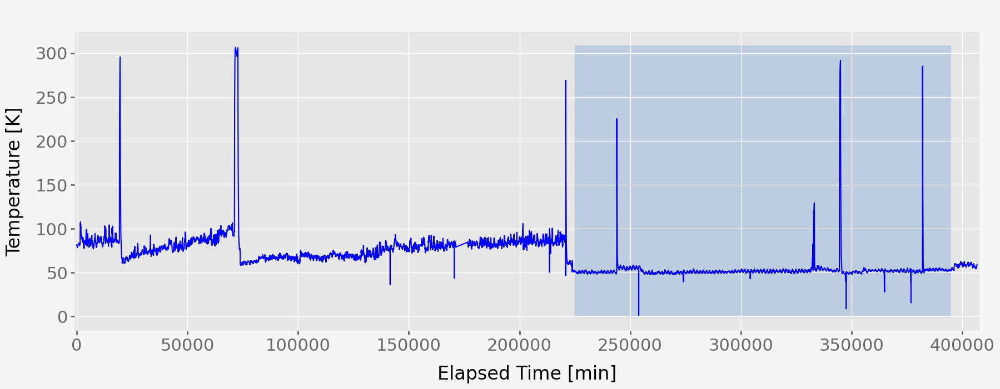

In [9]:
#Investigating and selecting data range for REFERENCE
sensorLocation = TemperatureDataFiles.m016.name

rfDt_strtTm_elpsd = 225000; rfDt_endTm_elpsd = 395000   #beginning and end of the reference section of the data

m_Dt = tempPlot_all.get_data(atSensorLoc=sensorLocation)
ax = get_plot_ax()
ax.plot(m_Dt.Elapsed_Time, m_Dt.Value, color='b')
ax.set_xlabel('Elapsed Time [min]')     
ax.set_ylabel('Temperature [K]')    
ax.set_title(' ')       

rf_Dt = tempPlot_all.get_data_for_elapsedTime_range(startTime=rfDt_strtTm_elpsd, endTime=rfDt_endTm_elpsd, atSensorLoc=sensorLocation)
rfDt_strtTm_elpsd = float(rf_Dt.Elapsed_Time[0])
rfDt_endTm_elpsd = float(rf_Dt.Elapsed_Time[-1])

hilite_plots(
    on_ax=ax, 
    for_data=m_Dt,   
    from_elapsed_time=rfDt_strtTm_elpsd, 
    to_elapsed_time=rfDt_endTm_elpsd,
    time_delta=tempPlot_all.get_time_delta(atSensorLoc = sensorLocation),
    min_y=0,  max_y=310,
    is_dateTime_axis=False
)
_ = adjust_plot_view(ax=ax, xMin=float(m_Dt.Elapsed_Time[0]-1000), xMax=float(m_Dt.Elapsed_Time[-1]+1000))


#### Preparing Data for Training

In [10]:
dt_for_detection = tempPlot_all.get_data(atSensorLoc=sensorLocation)

outlr_detection = OutlierDetection(
    data_for_detection = dt_for_detection, 
    ref_data_start_elapsed_time = rfDt_strtTm_elpsd, 
    ref_data_end_elapsed_time = rfDt_endTm_elpsd 
)

mDt = outlr_detection.get_original_data() 
rfDt = outlr_detection.get_reference_data()
mDt_strtTm_elpsd = float(mDt.Elapsed_Time[0])
mDt_endTm_elpsd = float(mDt.Elapsed_Time[-1])
tm_delta = outlr_detection.get_time_delta()


LOCATING OUTLIERS IN Reference dataset... waiting for last iteration
Last Iteration is 725

REMOVING OUTLIER VALUES IN Reference dataset...
Finished removing outlier(s) in Reference dataset

REPLACING OUTLIER VALUES IN Reference dataset...
Outlier value(s) in Reference dataset replaced

LOCATING OUTLIERS IN DATASET...
Finished locating outliers in dataset


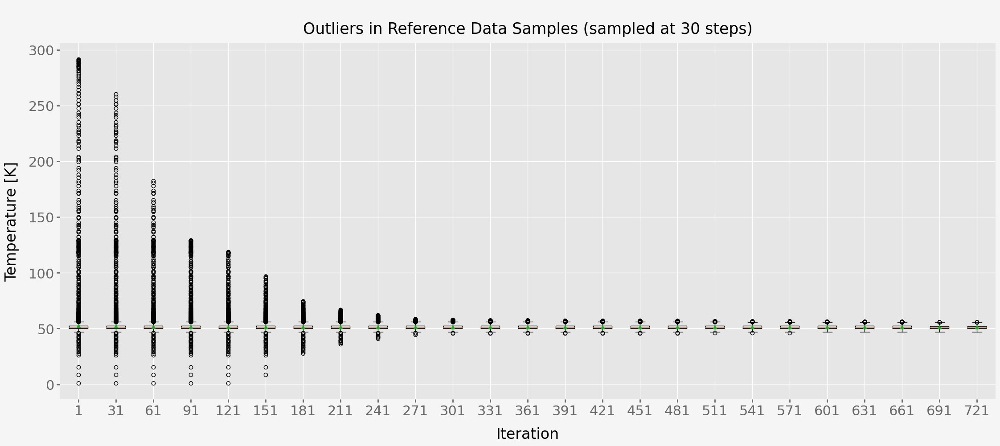

In [13]:
#Boxplot of Outliers in Reference Data samples Set
step_size = 30
ax:plt.Axes = outlr_detection.plot_boxplots(
    start_ndx = 0, 
    end_ndx = -1, 
    step_sz = step_size,
)
_ = ax.set_title(f'\nOutliers in Reference Data Samples (sampled at {step_size} steps)') 
ax.figure.set_size_inches(21,8)

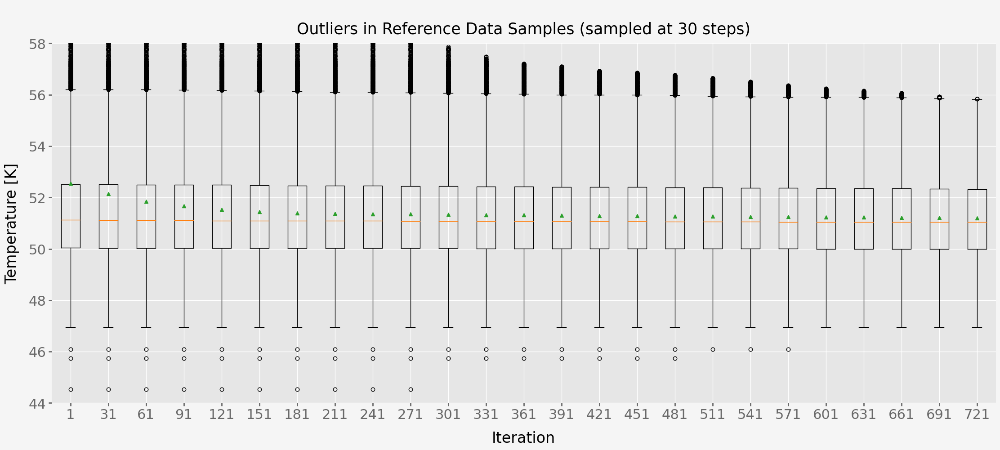

In [14]:
#Boxplot of Outliers in Reference Data samples Set
step_size = 30
ax:plt.Axes = outlr_detection.plot_boxplots(
    start_ndx = 0, 
    end_ndx = -1, 
    step_sz = step_size,
    minY=44,
    maxY=58
)
_ = ax.set_title(f'\nOutliers in Reference Data Samples (sampled at {step_size} steps)') 
ax.figure.set_size_inches(21,8)


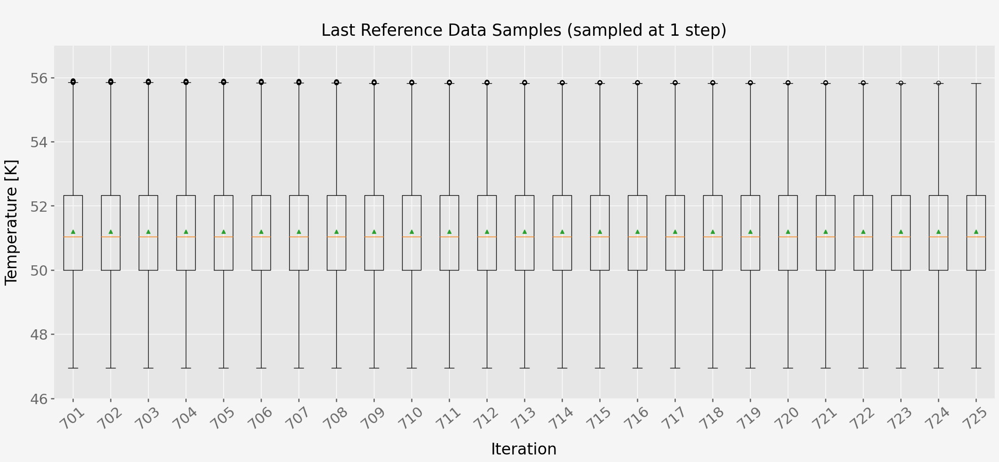

In [15]:
step_size = 1
ax = outlr_detection.plot_boxplots(
    start_ndx = -25, 
    end_ndx = -1, 
    step_sz = step_size,
    minY=46,
    maxY=57
)
_ = ax.set_title(f'\nLast Reference Data Samples (sampled at {step_size} step)') 
ax.tick_params(axis='x', rotation=40)


##### Exploring the Reference Data

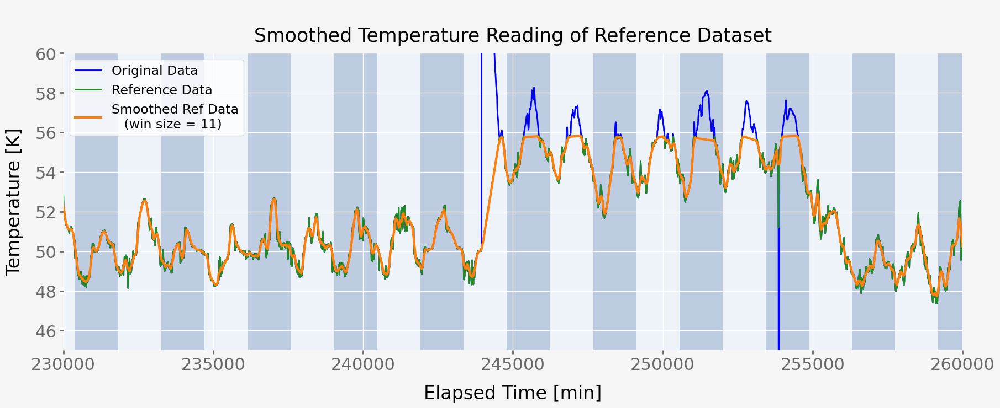

In [11]:
#Determining a suitable rolling window to smoothen data for the determining the period of the acf; and 
# therefore, the appropriate window size (period) for the seasonal data

rlng_win_sz = 11 
rfDt['rlng_mean'] = rfDt.Value.rolling(rlng_win_sz, center=True, closed='both').mean()
ax:plt.Axes = get_plot_ax() 
_ = ax.plot(mDt.Elapsed_Time, mDt.Value, color='b', linewidth=2, label="Original Data")    
_ = ax.plot(rfDt.Elapsed_Time, rfDt.Value, color='forestgreen', linewidth=2, label="Reference Data")
_ = ax.plot(rfDt.Elapsed_Time, rfDt.rlng_mean, color='tab:orange', linewidth=3, label=f"Smoothed Ref Data\n   (win size = {rlng_win_sz})")

ax.set_title('\nSmoothed Temperature Reading of Reference Dataset') 
ax.set_xlabel('Elapsed Time [min]')   
ax.set_ylabel('Temperature [K]')    
ax.legend()

hilite_plots(
    on_ax=ax, 
    for_data=mDt, 
    from_elapsed_time=0,  
    to_elapsed_time=None, 
    time_delta=tempPlot_all.get_time_delta(atSensorLoc = sensorLocation),
    show_time_windows=True,
    win_size=1440
)

adjust_plot_view( ax=ax, xMin=230000, xMax=260000, yMin=45, yMax=60)


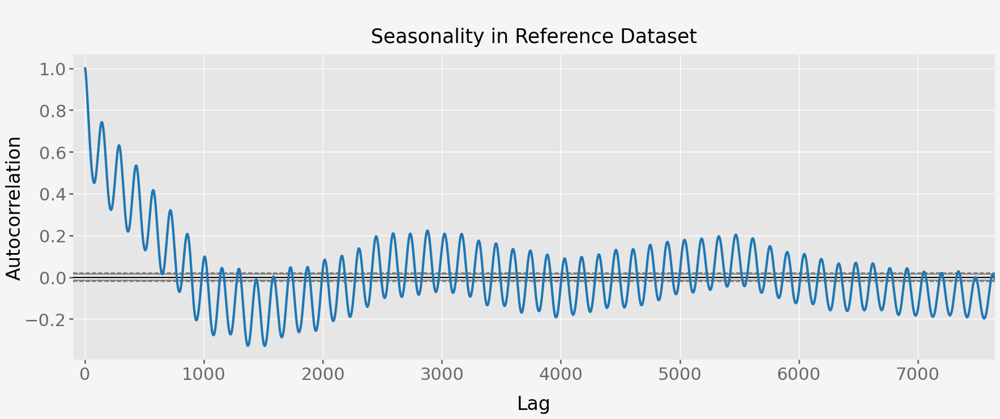

In [12]:
#PLOT OF ACF TO REVEAL SEASONALITY IN THE REFERENCE DATASET

rfDt_ma = rfDt.rlng_mean.dropna()

#Plotting the autocorrelation function
ax:plt.Axes = get_plot_ax()
_ = autocorrelation_plot(series=rfDt_ma, ax=ax, linewidth=3); format_ax(ax=ax)
ax.set_title('\nSeasonality in Reference Dataset', fontsize=25)
ax.set_xlabel('Lag')      
ax.set_ylabel('Autocorrelation', labelpad=0)  
ax.grid(True)  
nlg = len(rfDt_ma)
_ = adjust_plot_view(ax=ax, xMin=-100, xMax=0.45*nlg, yMin=None, yMax=None)
ax.figure.set_size_inches(21, 7)

In [13]:
# FUNCTION TO DETERMINE fft freqs AND COMPUTE THEIR PSDs:
from scipy.fft import rfft, rfftfreq    

def compute_PSD(sample_data:list)->pd.DataFrame:
    N = len(sample_data)
    yf = rfft(sample_data)
    xf = rfftfreq(N)
    psd = ((np.abs(yf))**2)/N 
    psd_arr = psd[1:]
    frqs_arr = xf[1:]
    psd_frq = pd.DataFrame(data={'freq':frqs_arr, 'PSD':psd_arr})
    psd_frq['period'] = (1/psd_frq.freq).round(2)
    return psd_frq

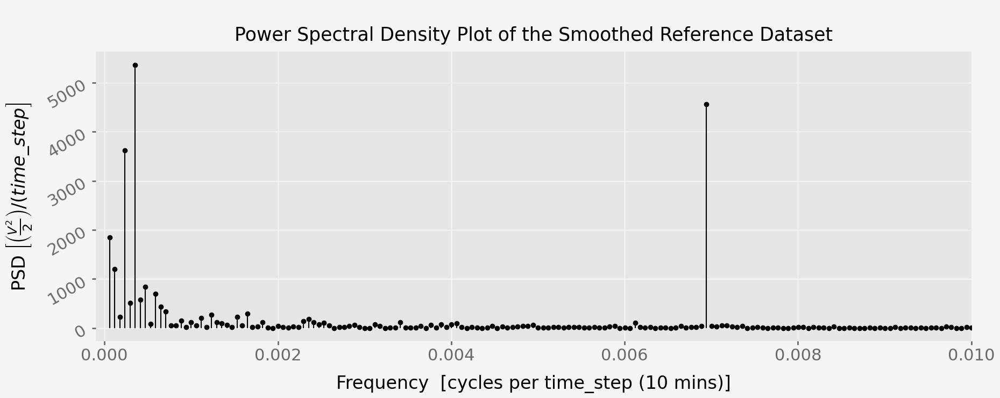

In [14]:
#Determining the seasonal period by performing Spectral analysis to determine dominant frequencies:

frq_psd = compute_PSD(sample_data=rfDt.rlng_mean.dropna().tolist()) 
frq_psd['index'] = [x for x in range(len(frq_psd))]
frq_psd = frq_psd[['index','freq','PSD','period']]

#Plotting the Periodogram
ax:plt.Axes = get_plot_ax()
_ = ax.stem(frq_psd.freq, frq_psd.PSD, linefmt='k-', basefmt='#fff0')   
ax.set_title('\nPower Spectral Density Plot of the Smoothed Reference Dataset')
ax.tick_params(axis='y', rotation=30)
ax.set_xlabel(f"Frequency  [cycles per time_step ({int(outlr_detection.get_time_delta())} mins)]")
ax.set_ylabel('PSD ' + r'$\left[\left(\frac{V^2}{2}\right)/(time\_step\right]$')  
adjust_plot_view(ax=ax, xMin=-0.0001, xMax=0.01)

In [17]:
#FUNCTIONS TO GENERATE PLOTS FOR COMPARING AND IDENTIFYING THE RIGHT SEASONAL PERIOD

def compare_seasonal_periods(m_data:pd.DataFrame, psd_prd:pd.DataFrame, period_unit:str, isDateTimeAxis)->fgr.Figure:
    fg:fgr.Figure = plt.figure(figsize=(20, 5*len(psd_prd)), dpi=200, constrained_layout=True)
    fg.suptitle(' ', fontdict={'size':15})
    axs:list[plt.Axes] = fg.subplots(len(psd_prd), 1, sharex=True, squeeze=True)
    
    for j in range(len(psd_prd)):
        ax:plt.Axes = axs[j]
        format_ax(ax=ax)
        if isDateTimeAxis:
            ax.plot(m_data.index, m_data.Value, color='b', lw=2.5)
        else:
            ax.plot(m_data.Elapsed_Time, m_data.Value, color='b', lw=2.5)
        ax.set_title(f'     PSD = {psd_prd.PSD[j]};      period = {int(psd_prd.period[j])} {period_unit} (time window = {int(psd_prd.period[j])*10} mins)', size=18, weight='semibold', loc='left')  
        ax.set_xlabel(' ')
        ax.set_ylabel('Temperature [K]') 

        hilite_plots(
            on_ax=ax, 
            for_data=m_data,  
            is_dateTime_axis=isDateTimeAxis,
            show_time_windows=True, 
            win_size=float(psd_prd.period[j]*tm_delta),  
            time_delta=tm_delta,    
            hlt_alpha=[0.75, 0.75]
        )

    xMn = float(m_data.Elapsed_Time[0] - min(psd_prd.period)*tm_delta)
    xMx = float(m_data.Elapsed_Time[-1] + min(psd_prd.period)*tm_delta)
    axs[-1].set_xlabel(f'Elapsed Time [min]')
    if isDateTimeAxis:
        xMn = f'{m_data.index[0] - timedelta(minutes=float(min(psd_prd.period)*tm_delta))}'
        xMx = f'{m_data.index[-1] + timedelta(minutes=float(min(psd_prd.period)*tm_delta))}'
        axs[-1].set_xlabel(f'Date-Time')

    for ax in axs: adjust_plot_view(ax=ax, xMin=xMn, xMax=xMx)
    return fg

def compare_acf_periods(m_data:pd.DataFrame, psd_prd:pd.DataFrame, period_unit:str)->fgr.Figure:    
    fg:fgr.Figure = plt.figure(figsize=(20, 5*len(psd_prd)), dpi=200, constrained_layout=True)
    fg.suptitle(' ', fontdict={'size':15})
    axs:list[plt.Axes] = [] 
    if len(psd_prd)==1:
        axs.append(fg.subplots(squeeze=True))
    else:
        axs = fg.subplots(len(psd_prd), 1, sharex=True, squeeze=True)

    acf_dt = m_data.Value.tolist()
    nlg = len(acf_dt)
    acf_vals = acf(acf_dt, nlags=nlg)
    tm_ndx = [f'{x}' for x in range(nlg)]
    dt_fr_hlt = pd.DataFrame(data={'ndx': tm_ndx,'Elapsed_Time': list(range(nlg)), 'Value': acf_vals})
    dt_fr_hlt.set_index('ndx', inplace=True)

    for j in range(len(psd_prd)):
        ax:plt.Axes = axs[j]; format_ax(ax=ax)
        _ = autocorrelation_plot(series=acf_dt, ax=ax, lw=2.5, color='tab:blue')
        ax.set_title(f'     PSD = {psd_prd.PSD[j]};      period = {int(psd_prd.period[j])} {period_unit} (time window = {int(psd_prd.period[j])*10} mins)', size=18, weight='semibold', loc='left')  
        
        ax.set_xlabel(' ')
        ax.set_ylabel('Autocorrelation')
    
        hilite_plots(
            on_ax=ax, 
            for_data=dt_fr_hlt, 
            time_delta=1,   
            show_time_windows=True,
            win_size=psd_prd.period[j],  
            hlt_alpha=[0.75, 0.75]
        )
 
    for ax in axs:
        adjust_plot_view(
            ax=ax, 
            xMin=float(dt_fr_hlt.Elapsed_Time[0] - min(psd_prd.period)),   
            xMax=float(dt_fr_hlt.Elapsed_Time[-1] + min(psd_prd.period))
        )
    axs[-1].set_xlabel('Lag')
    return fg

In [18]:
psd_prd = frq_psd.sort_values(by='PSD', ascending=False)[:5].copy()
psd_prd = psd_prd[['PSD','period']]
psd_prd.reset_index(inplace=True)
psd_prd.drop(['index'], axis=1, inplace=True)
psd_prd.PSD = round(psd_prd.PSD,2)

fr_psd_prd = []
for j in range(len(psd_prd)):
    if round(math.modf(psd_prd.period[j])[0], 2) >= 0.75:
        fr_psd_prd.append(round(psd_prd.period[j])) 
    else:
        fr_psd_prd.append(int(psd_prd.period[j]))
psd_prd.period = fr_psd_prd
frq_psd.sort_values(by='PSD', ascending=False).head(5)


,index,freq,PSD,period
5,5,0.000353,5361.337798,2832.0
117,117,0.006944,4565.507517,144.0
3,3,0.000235,3622.261365,4248.0
0,0,0.000059,1848.926097,16992.0
1,1,0.000118,1206.160229,8496.0


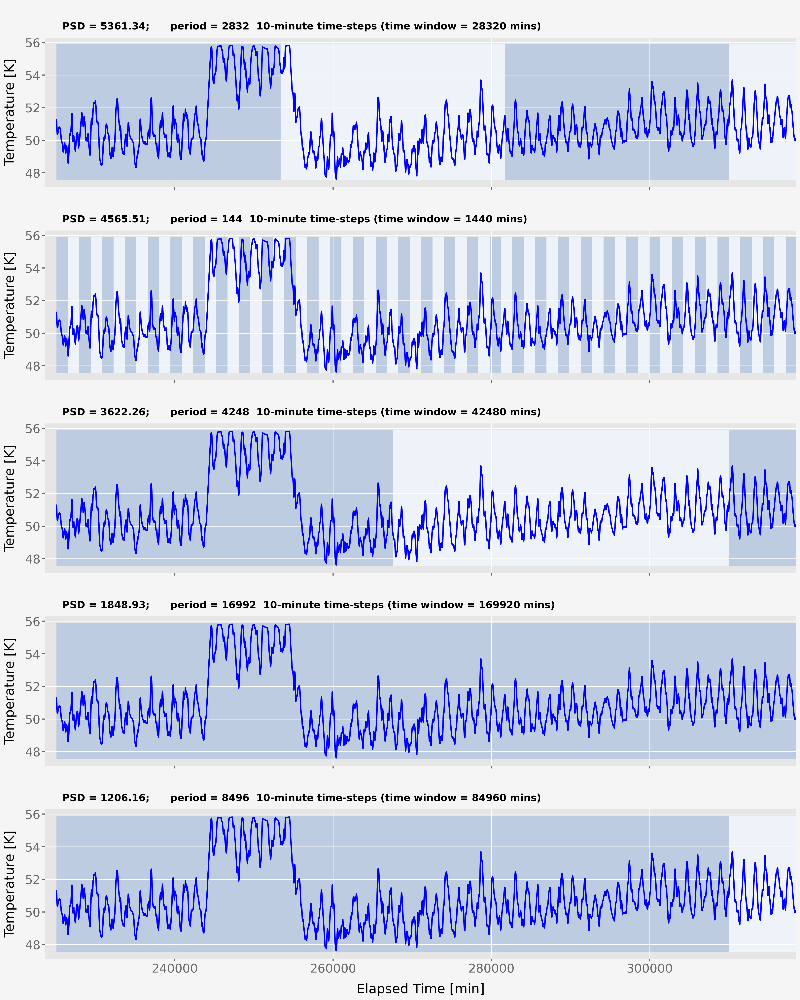

In [19]:
# Comparing Periods of Highest PSDs to Determine Seasonality of the Sunspot Dataset:

m_df = rfDt[['Elapsed_Time', 'rlng_mean']].copy()
m_df.dropna(inplace=True)
m_df.rename(columns={'rlng_mean':'Value'}, inplace = True)

isDtTmAx = False
fg = compare_seasonal_periods(m_data=m_df, psd_prd=psd_prd, period_unit=' 10-minute time-steps', isDateTimeAxis=isDtTmAx)

xMx = float(m_df.Elapsed_Time[int(0.55*len(m_df))])
if isDtTmAx: 
    xMx = f'{m_df[m_df.Elapsed_Time==xMx].index[0]}'

for ax in fg.axes: adjust_plot_view(ax=ax, xMax=xMx)

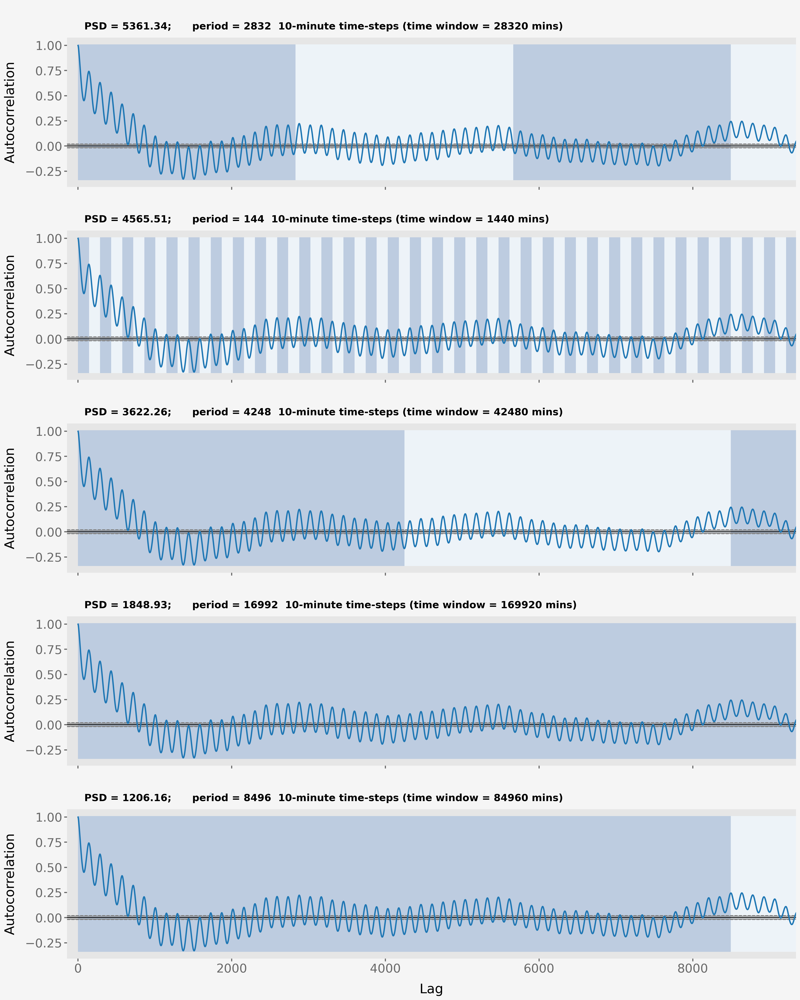

In [20]:
# Comparing Periods of Highest PSDs to Determine Seasonality of the Sunspot Dataset (Using ACF):
fg = compare_acf_periods(m_data=m_df, psd_prd=psd_prd, period_unit=' 10-minute time-steps')
for ax in fg.axes: adjust_plot_view(ax=ax, xMax=float(int(0.55*len(m_df))))

In [21]:
ssnl_prd = 144
wn_sz = tm_delta * ssnl_prd
wn_sz

1440

In [22]:
#PARTITIONING THE ENTIRE DATASET INTO CONTIGUOUS SEGMENTS OF A FIXED TIME WINDOW SIZE (TIME WIDTH)

outlr_detection.create_windowed_data(with_window_size=wn_sz)

mDt = outlr_detection.get_original_data()
rfVls = outlr_detection.get_reference_vals()


CREATING windowed data...
Windowed data created

CREATING Reference Values...
Reference Values created

SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments


In [23]:
f"{outlr_detection.get_time_window_size()} {outlr_detection.get_time_unit()}"

'1440 min'

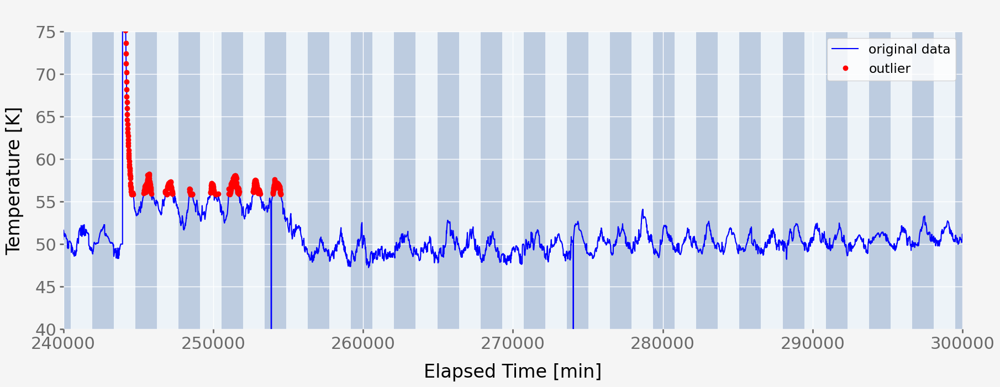

In [24]:
#SHOWING WINDOWED DATA

ax:plt.Axes = get_plot_ax()
ax.set_title(' ')
outlr_detection.plot_data(on_ax=ax) 
outlr_detection.show_windowed_data(
  on_ax=ax,
  show_outliers=True,
  show_counts=True
)
ax.legend()
adjust_plot_view(ax=ax, xMin=240000, xMax=300000, yMin=40, yMax=75)

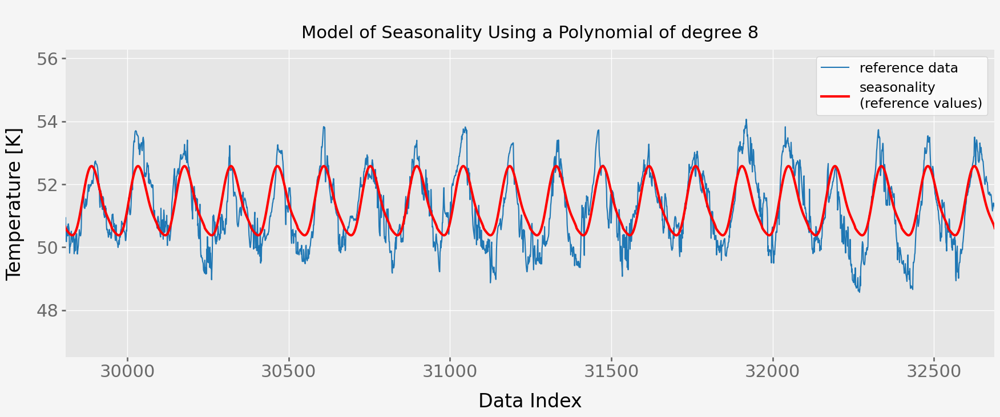

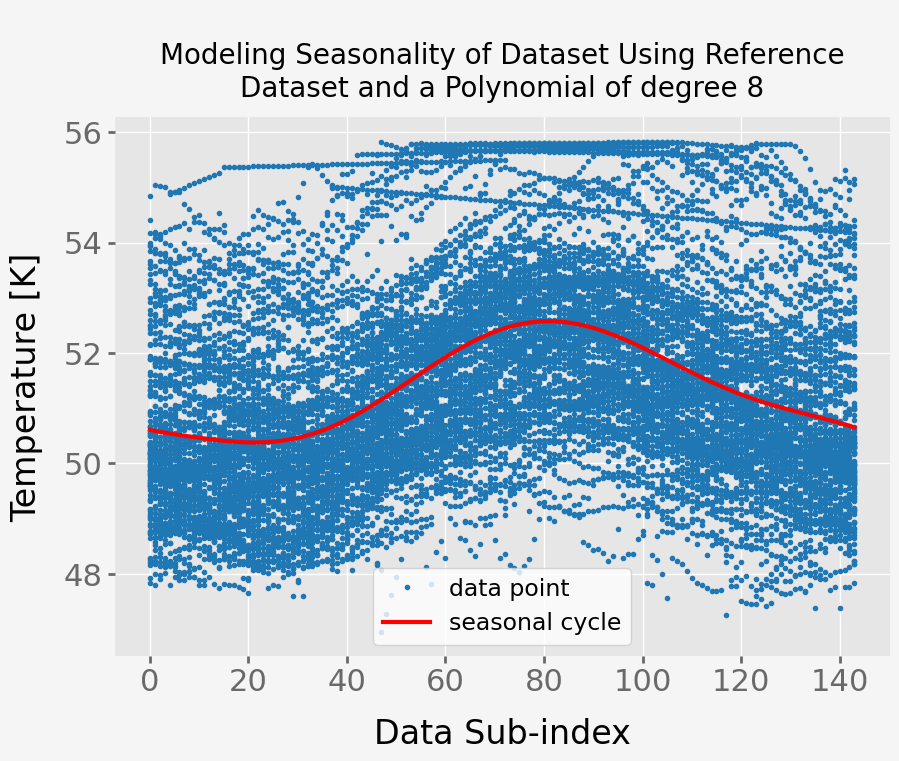

In [25]:
#DETERMINING THE BEST POLYNOMIAL DEGREE FOR MODEL THE SEASONALITY OF THE ENTIRE DATASET, USING THE REFERENCE DATASET
ssnl_ply_dgr = 8

ax1 = outlr_detection.model_seasonality(  
    using_deg=ssnl_ply_dgr,
    plot_scatter=False,
    plot_line=True,
    show_range={'from_cycle':50, 'num_of_cycles':20},
    #show_points_superimposed=True
)
ax1.set_title(f"\nModel of Seasonality Using a Polynomial of degree {ssnl_ply_dgr}", fontdict={'size':22})

ax2 = outlr_detection.model_seasonality(
    using_deg=ssnl_ply_dgr,
    #plot_scatter=True,
    #plot_line=True,
    show_range={'from_cycle':0, 'num_of_cycles':1},
    show_points_superimposed=True
)


In [26]:
#MODELING THE ENTIRE DATASET, INCORPORATING ITS SEASONALITY 

outlr_detection.model_dataset(using_polynomial_degree=ssnl_ply_dgr)

mDt = outlr_detection.get_original_data()
rfVls = outlr_detection.get_reference_vals()


CREATING Reference Values...
Reference Values created

SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments


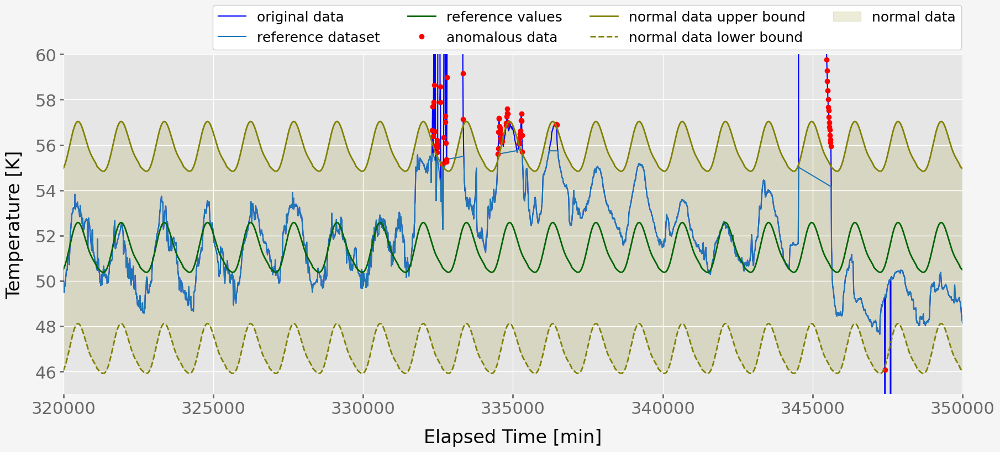

In [27]:
# SHOWING VARIOUS SECTIONS OF THE ENTIRE DATASET

ax:plt.Axes = get_plot_ax()
outlr_detection.plot_data(on_ax=ax)
ax.plot(rfDt.Elapsed_Time, rfDt.Value, color='tab:blue', alpha=1, label='reference dataset')
outlr_detection.plot_reference_values(on_ax=ax)
outlr_detection.plot_anomalous_data(on_ax=ax)
outlr_detection.plot_normal_data_bounds(on_ax=ax)   

ax.set_title(' ')
ax.legend()
hndls, lbls = ax.get_legend_handles_labels()
ax.legend().remove()
lbls[4] = 'normal data upper bound'
lbls[5] = 'normal data lower bound'
ax.legend(hndls, lbls, fontsize=18, facecolor='white', framealpha=1, bbox_to_anchor=(0., 1.01, 1., .102), loc='lower right', ncols=4, borderaxespad=0.1) 

adjust_plot_view(
    ax=ax, 
    xMin=320000,    
    xMax=350000,
    yMin=45,        
    yMax=60        
)
ax.figure.set_size_inches(21,8)

In [28]:
# FUNCTION IMPLEMENTATIONS FOR COMPUTING THRESHOLDS USING THRESHOLD FACTORS:

# Scaling the refVals (to the feature mean thresholds) to obtain values to compute the upper threshold of the std feature:
def compute_scaled_ref_vals(rf_vals:pd.DataFrame)->float:
    rf_vls = rf_vals;    fx = []
    a = min(rf_vls.l_bound);     b = max(rf_vls.u_bound)
    f_mn = min(rf_vls.Value);    f_mx = max(rf_vls.Value)

    if f_mn==f_mx:  #-----Special case of horizontal linear model of seasonality--------
        x = rf_vls.sub_index;   N = x.size
        if math.fmod(N,2)>0:
            x_md = x[1+int(N/2)]    
        else:
            x_md = x[int(N/2)]

        l1 = x_md;  l2 = N - l1
        fx = np.linspace(a,b,l1).tolist()
        fx = [round(fx[j],5) for j in range(len(fx))]
        fx = fx[:l1] + (np.linspace(b,a,l2+1).tolist())[1:]
        fx = pd.Series([round(fx[j],5) for j in range(len(fx))])
        f_mn = min(fx)
        f_mx = max(fx)
    else:
        fx = rf_vls.Value

    fx2 = (fx - f_mn) * ((b-a)/(f_mx-f_mn)) + a
    return fx2


# Setting thresholds for the training feature set: 'ftr_mean' and 'ftr_std': --kp
def set_thresholds(thld_fctrs:dict={'_mean':1, '_std':[0.05, 0.5]})->list:
    rf_vls:pd.DataFrame = outlr_detection.get_reference_vals()
    rf_Dt:pd.DataFrame = outlr_detection.get_reference_data()
    thlds = {'_mean':[0,0], '_std':[0,0]}
    
    if not(rf_vls.empty):                
        d_1 = max(rf_Dt.Value.values) - stts.mean(rf_vls.Value.values) 
        d_2 = stts.mean(rf_vls.Value.values) - min(rf_Dt.Value.values)
        max_d = max(d_1, d_2)
        k = max_d * thld_fctrs['_mean']  #mean_shift 
        rf_vls['l_bound'] = [(rf_vls.Value[x] - k) for x in range(len(rf_vls))] 
        rf_vls['u_bound'] = [(rf_vls.Value[x] + k) for x in range(len(rf_vls))] 
        thlds['_mean'][0] = stts.mean(rf_vls.l_bound)
        thlds['_mean'][1] = stts.mean(rf_vls.u_bound)
    
        rf_vls['scaled_Val'] = compute_scaled_ref_vals(rf_vals=rf_vls)
        thlds['_std'][0] = thld_fctrs['_std'][0] * stts.stdev(rf_vls.scaled_Val)
        thlds['_std'][1] = thld_fctrs['_std'][1] * stts.stdev(rf_vls.scaled_Val)
        return [thlds, rf_vls]
    else:
        print(Fore.RED+"\nError! "+Fore.GREEN+f"No windowed data created. Create one first (by setting a window size) before issuing this command.\n") #Error Message
        return None



#FUNCTIONS TO COMPARE THE EFFECTS OF FEATURE THRESHOLD FACTORS ON CLASSIFICATION OF DATA SEGMENTS (WINDOWED DATA):

def compare_mean_factor_effects_normal_data_boundaries(thold_factors_list:list[dict])->fgr.Figure:
    rf_vls = outlr_detection.get_reference_vals()
    x = rf_vls.sub_index
    fx = rf_vls.Value
    fg:fgr.Figure = plt.figure(figsize=(7*len(thold_factors_list), 10), layout='constrained')
    axs:list[plt.Axes] = fg.subplots(1, len(thold_factors_list), sharey=True)
    fg.suptitle("\nEffect of Threshold 'mean' Factor Adjustments on the bounds of normal data", fontsize=20, fontweight='semibold')

    for j in range(len(thold_factors_list)):
        t_hlds,rf_vls = set_thresholds(thld_fctrs=thold_factors_list[j])
        ax:plt.Axes = axs[j]    #fg.axes[j]    
        ax.plot(x, rf_vls.u_bound, c='purple', lw=2, label='normal data\nupper bound')
        ax.hlines(stts.mean(rf_vls.u_bound), x[0], x[x.size-1], ls='dashed', lw=2, colors='purple', label='mean of\nupper bound')
        ax.plot(x, fx, c='tab:green', lw=2, label='data model')
        ax.hlines(stts.mean(fx), x[0], x[x.size-1], ls='dashed', lw=2, color='tab:green', label='mean of\ndata model')
        ax.plot(x, rf_vls.l_bound, c='brown', lw=2, label='normal data\nlower bounda')
        ax.hlines(stts.mean(rf_vls.l_bound), x[0], x[x.size-1], ls='dashed', lw=2, colors='brown', label='mean of\nlower bound')
        ax.plot(x, rf_vls.scaled_Val, c='k', lw=2, label='scaled data\nmodel')
        
        if j==0:
            ax.set_xlabel('Sub-index of Data Point')
            ax.set_ylabel('Temperature [K]')
        if j==(len(thold_factors_list)-1):
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

        ax.set_title(f"\nmean factor: {thold_factors_list[j]['_mean']}", fontsize=18)
        print(f"The thresholds are: {t_hlds}")
    return fg


def compare_threshold_factors_on_dataSegment_labeling(thold_factors_list:list[dict])->fgr.Figure:
    fg:fgr.Figure = plt.figure(figsize=(7*len(thold_factors_list), 6), layout='constrained')
    fg.set_facecolor(mpl.colors.to_rgba(c='white', alpha=0))
    fg.suptitle("Effect of Threshold Factor Adjustments on the Feature Thresholds\n\n", fontsize=20, fontweight='semibold')
    sbfg:fgr.SubFigure = fg.subfigures()
    axs:list[plt.Axes] = sbfg.subplots(1, len(thold_factors_list), sharey=True)

    #------
    fg_2:fgr.Figure = plt.figure(figsize=(21, 24), layout='constrained')
    fg_2.set_facecolor(mpl.colors.to_rgba(c='white', alpha=0))
    sbfg_2:fgr.SubFigure = fg_2.subfigures()
    axs_2:list[plt.Axes] = sbfg_2.subplots(len(thold_factors_list), 1, sharex=True)
    #------

    for j in range(len(thold_factors_list)):
        t_hld_fctrs = thold_factors_list[j]
        outlr_detection.adjust_threshold_factors(
            mean_factor=t_hld_fctrs['_mean'],
            std_factor_lower=t_hld_fctrs['_std'][0],
            std_factor_upper=t_hld_fctrs['_std'][1]
        )

        mDt = outlr_detection.get_original_data()
        t_hlds = outlr_detection.get_thresholds()
        m_thld = t_hlds['mean']
        std_thld = t_hlds['std']

        m_dta_1 = mDt[mDt.is_anomalous_seg_start==1]
        m_dta_2 = mDt[mDt.is_anomalous_seg_start==0]
        
        ax:plt.Axes = axs[j];   format_ax(ax=ax)  
        ax.set_title(f"\n mean factor: {t_hld_fctrs['_mean']}         std factors: {t_hld_fctrs['_std']}", loc='left', size=18, pad=7)
        ax.set_xlabel('')
        ax.set_ylabel('')
        _ = ax.scatter(x=m_dta_1.ftr_mean, y=m_dta_1.ftr_std, c='tab:blue', s=20, label='anomalous window')
        _ = ax.scatter(x=m_dta_2.ftr_mean, y=m_dta_2.ftr_std, c='tab:orange', s=20, label='normal window')
        ax.hlines(y=std_thld[0], xmin=m_thld[0], xmax=m_thld[1], ls='--', lw=2.5, colors='tab:green', label='mean lower threshold')
        ax.hlines(y=std_thld[1], xmin=m_thld[0], xmax=m_thld[1], ls='-', lw=2.5, colors='tab:green', label='mean upper threshold')
        ax.vlines(x=m_thld[0], ymin=std_thld[0], ymax=std_thld[1], ls='--', lw=2.5, colors='purple', label='std lower threshold')
        ax.vlines(x=m_thld[1], ymin=std_thld[0], ymax=std_thld[1], ls='-', lw=2.5, colors='purple', label='std upper threshold')
        adjust_plot_view(ax=ax, xMin=40, xMax=65, yMin=-1, yMax=6)
        

        ax_2:plt.Axes = axs_2[j]; format_ax(ax=ax_2)
        outlr_detection.plot_data(on_ax=ax_2)
        outlr_detection.plot_anomalous_data(on_ax=ax_2)
        outlr_detection.show_anomalous_segments(on_ax=ax_2)

        ax_2.set_title(
            "\n" + r"$\hspace{3.2}$" + f"mean factor :  {t_hld_fctrs['_mean']}" + "\n"+
            r"$\hspace{0.5}$" + f"mean thresholds :  {[round(j,5) for j in t_hlds['mean']]}",
            loc='left', ha='left', weight='semibold', size=18, pad=7
        )
        ax_2.set_title(
            "\n" + r"$\hspace{2.1}$" + f"std factors :  {t_hld_fctrs['_std']}" + "\n"+
            f"std thresholds :  {[round(j,5) for j in t_hlds['std']]}",
            loc='center', ha='left', size=18, weight='semibold', pad=7
        )

        ax_2.set_xlabel(' ')
        ax_2.set_ylabel('Temperature [K]')
        adjust_plot_view(ax=ax_2, xMin=-2*float(wn_sz), xMax=float(mDt.Elapsed_Time[-1] + 2*wn_sz))


    axs[0].set_xlabel('mean')
    axs[0].set_ylabel('std')
    axs[0].legend()
    hndls, lbls = axs[0].get_legend_handles_labels()
    axs[0].legend().remove()
    sbfg.legend(hndls, lbls, fontsize=18, facecolor=plt.rcParams['figure.facecolor'], framealpha=1, bbox_to_anchor=(0., 1.005, 1., .102), loc='lower left', mode="expand", ncols=6, borderaxespad=0.1)

    axs_2[2].set_xlabel('Elapsed Time [min]')
    axs_2[0].legend()
    hndls, lbls = axs_2[0].get_legend_handles_labels()
    axs_2[0].legend().remove()
    frAnmly = Rectangle(xy=[0,0], width=0, height=0, angle=0, edgecolor='none', facecolor='r', alpha=0.3, fill=True, lw=1, label='anomalous') 
    hndls.append(frAnmly)
    lbls.append('anomalous segment')
    frAnmly = Rectangle(xy=[0,0], width=0, height=0, angle=0, edgecolor='none', facecolor='r', alpha=0.15, fill=True, lw=1, label='anomalous') 
    hndls.append(frAnmly)
    lbls.append('anomalous segment')
    frAnmly = Rectangle(xy=[0,0], width=0, height=0, angle=0, ls='--', edgecolor='r', facecolor='none', alpha=1, fill=False, lw=1, label='section') 
    hndls.append(frAnmly)
    lbls.append('contigous anomalous segments')
    sbfg_2.legend(hndls, lbls, fontsize=18, facecolor=plt.rcParams['figure.facecolor'], framealpha=1, bbox_to_anchor=(0., 1.005, 1., .102), loc='lower left', mode="expand", ncols=6, borderaxespad=0.1)#, mode="expand")   #
    
    return fg

The thresholds are: {'_mean': [46.9075176721274, 55.8261], '_std': [0.38741839650284754, 3.8741839650284753]}
The thresholds are: {'_mean': [44.67787209015925, 58.05574558196815], '_std': [0.2714175666065628, 2.714175666065628]}
The thresholds are: {'_mean': [49.13716325409555, 53.59645441803185], '_std': [1.160008298962848, 3.480024896888544]}


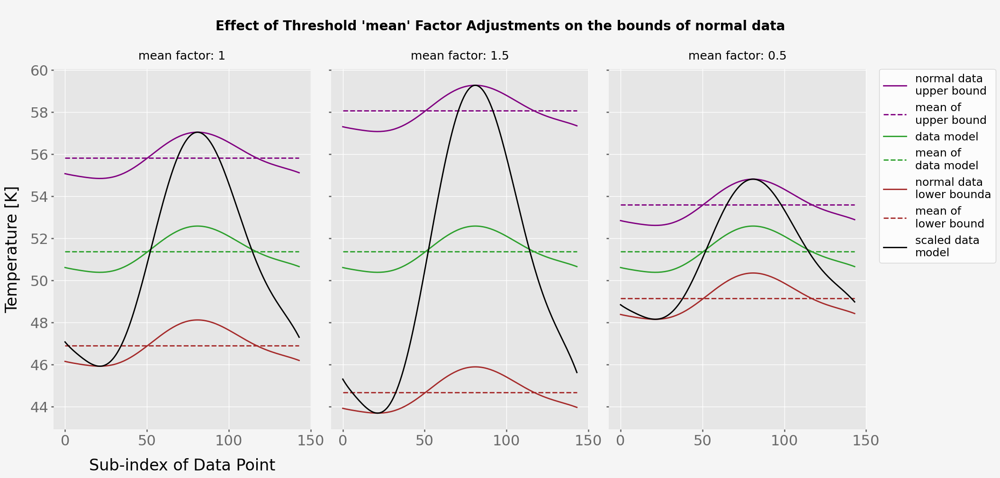

In [29]:
# COMPARING THE EFFECT OF THRESHOLD MEAN FACTOR ON THRESHOLDS (for data points and training features):
t_hlds_lst = [
    {'_mean':1, '_std':[0.1, 1]},
    {'_mean':1.5, '_std':[0.05, 0.5]},
    {'_mean':0.5, '_std':[0.5, 1.5]},
]
fg1 = compare_mean_factor_effects_normal_data_boundaries(thold_factors_list=t_hlds_lst)


SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments

SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments

SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments


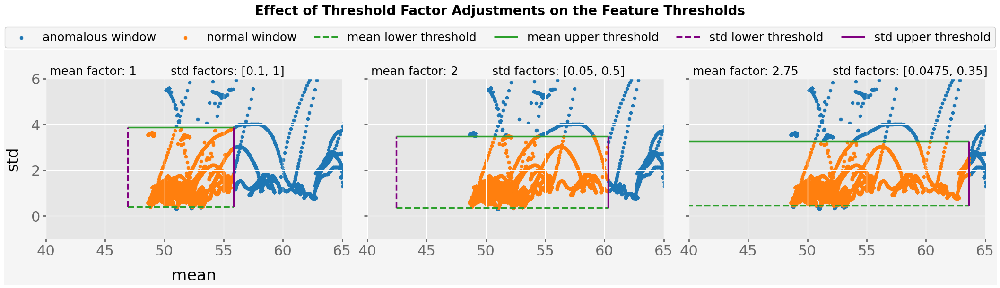

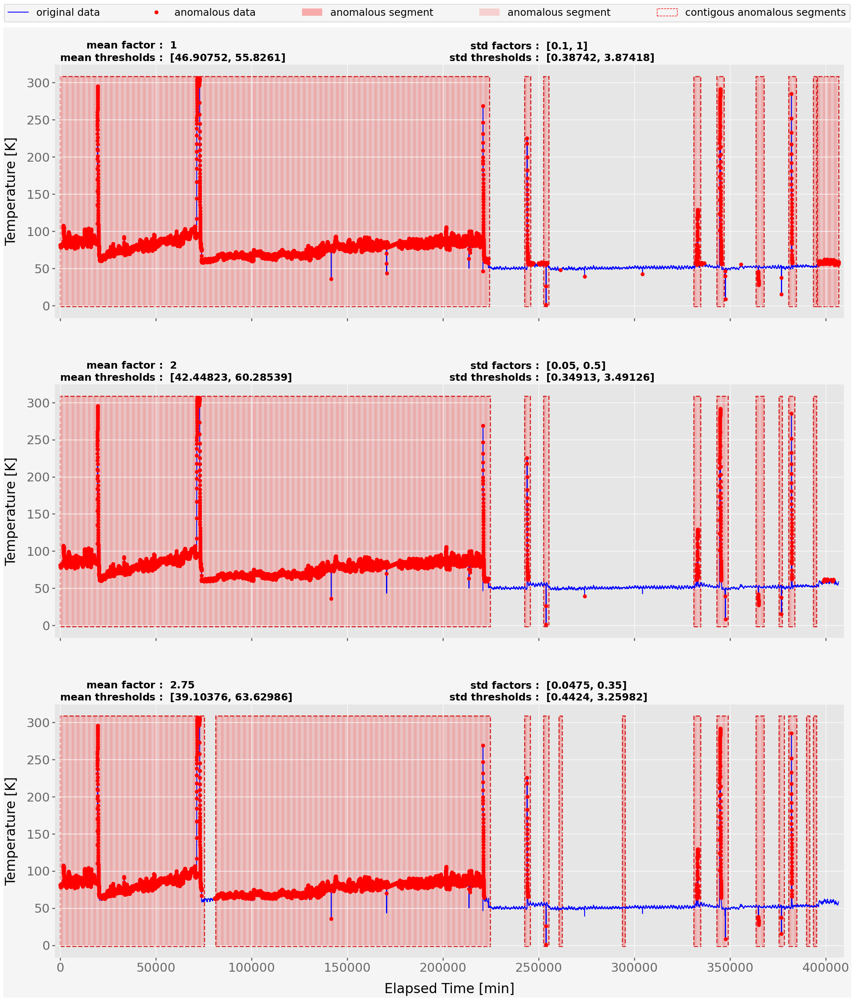

In [30]:
# THE EFFECT OF THRESHOLD FACTORS ON FEATURE THRESHOLDS AND CLASSIFICATION OF DATA SEGMENTS (WINDOWED DATA):
t_hlds_lst = [
    {'_mean':1, '_std':[0.1, 1]},
    {'_mean':2, '_std':[0.05, 0.5]},
    {'_mean':2.75, '_std':[0.0475, 0.35]}
]
fg2 = compare_threshold_factors_on_dataSegment_labeling(thold_factors_list=t_hlds_lst)

In [31]:
#CHANGING THE THRESHOLD FACTORS TO FINE-TUNE THE MODEL

outlr_detection.adjust_threshold_factors(mean_factor=2.75, std_factor_lower=0.0475, std_factor_upper=0.35)

mDt = outlr_detection.get_original_data()
rfVls = outlr_detection.get_reference_vals()
print(f"\nthreshold_factors:\n   {outlr_detection.get_threshold_factors()}")
print(f"thresholds:\n   {outlr_detection.get_thresholds()}")



SETTING THRESHOLD VALUES...
Finished setting threshold values

LOCATING ANOMALOUS DATA POINTS IN DATASET...
Finished locating anomalous data points in dataset

DETERMINING THE ANOMALY STATUS OF DATASET SEGMENTS...
Finished determining anomaly status of dataset segments

threshold_factors:
   {'mean': 2.75, 'std': [0.0475, 0.35]}
thresholds:
   {'mean': [39.10375813523887, 63.62985953688852], 'std': [0.4424040631196898, 3.2598194124608724]}


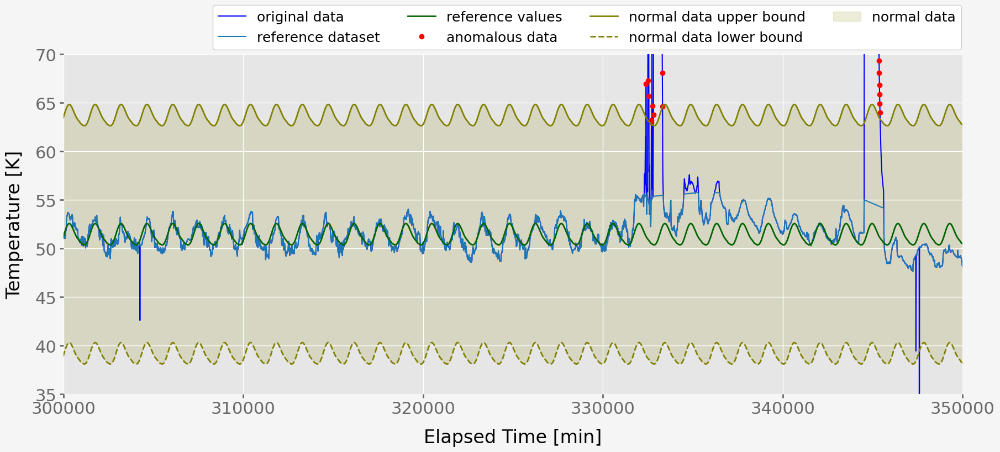

In [32]:
# SHOWING VARIOUS SECTIONS OF THE ENTIRE DATASET--2
ax:plt.Axes = get_plot_ax()
outlr_detection.plot_data(on_ax=ax)
ax.plot(rfDt.Elapsed_Time, rfDt.Value, color='tab:blue', alpha=1, label='reference dataset')
outlr_detection.plot_reference_values(on_ax=ax)
outlr_detection.plot_anomalous_data(on_ax=ax)
outlr_detection.plot_normal_data_bounds(on_ax=ax)   

ax.set_title(' ')
ax.legend()
hndls, lbls = ax.get_legend_handles_labels()
ax.legend().remove()
lbls[4] = 'normal data upper bound'
lbls[5] = 'normal data lower bound'
ax.legend(hndls, lbls, fontsize=18, facecolor='white', framealpha=1, bbox_to_anchor=(0., 1.01, 1., .102), loc='lower right', ncols=4, borderaxespad=0.1) 

adjust_plot_view(
    ax=ax, 
    xMin=300000,    
    xMax=350000,
    yMin=35,        
    yMax=70        
)
ax.figure.set_size_inches(21,8)

In [33]:
mDt

,Value,Elapsed_Time,is_outlier,is_anomalous,ftr_mean,ftr_std,is_anomalous_seg_start
Date_Time,,,,,,,
2019-01-01 00:10:06,81.31800,0,1,1,81.48171,1.23630,1.0
2019-01-01 00:20:06,81.38300,10,1,1,81.49122,1.24029,1.0
2019-01-01 00:30:06,81.25296,20,1,1,81.50113,1.24511,1.0
2019-01-01 00:40:06,81.09760,30,1,1,81.51006,1.24793,1.0
2019-01-01 00:50:06,81.03258,40,1,1,81.51932,1.24979,1.0
...,...,...,...,...,...,...,...
2019-10-10 10:10:06,58.01558,406680,1,0,NaN,NaN,NaN
2019-10-10 10:20:06,58.20484,406690,1,0,NaN,NaN,NaN
2019-10-10 10:30:06,58.33609,406700,1,0,NaN,NaN,NaN


In [34]:
rfDt

,Value,Elapsed_Time,was_outlier,rlng_mean
Date_Time,,,,
2019-06-06 06:10:06,51.80146,225000,0,NaN
2019-06-06 06:20:06,51.80853,225010,0,NaN
2019-06-06 06:30:06,51.88242,225020,0,NaN
2019-06-06 06:40:06,51.80052,225030,0,NaN
2019-06-06 06:50:06,51.35751,225040,0,NaN
...,...,...,...,...
2019-10-02 06:50:06,51.79864,394960,0,51.947944
2019-10-02 07:00:06,51.78873,394970,0,NaN
2019-10-02 07:10:06,51.80570,394980,0,NaN


In [35]:
outlr_detection.get_windowed_data()

,window_start
Date_Time,
2019-01-01 00:10:06,0
2019-01-02 00:10:06,1440
2019-01-03 00:10:06,2880
2019-01-04 00:10:06,4320
2019-01-05 00:10:06,5760
...,...
2019-10-06 00:10:06,400320
2019-10-07 00:10:06,401760
2019-10-08 00:10:06,403200


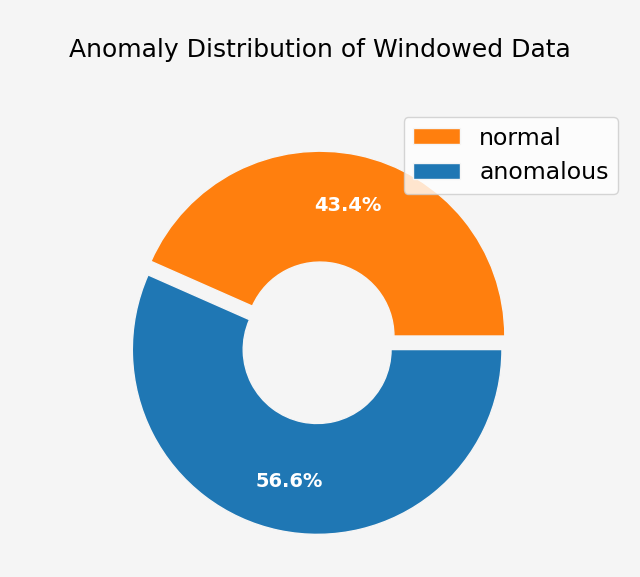

In [36]:
ax = outlr_detection.plot_class_distribution(for_data=DistributionData.windowed_data)
_ = ax.set_title(f"{ax.get_title()}", fontdict={'size':18, 'weight':'medium'})

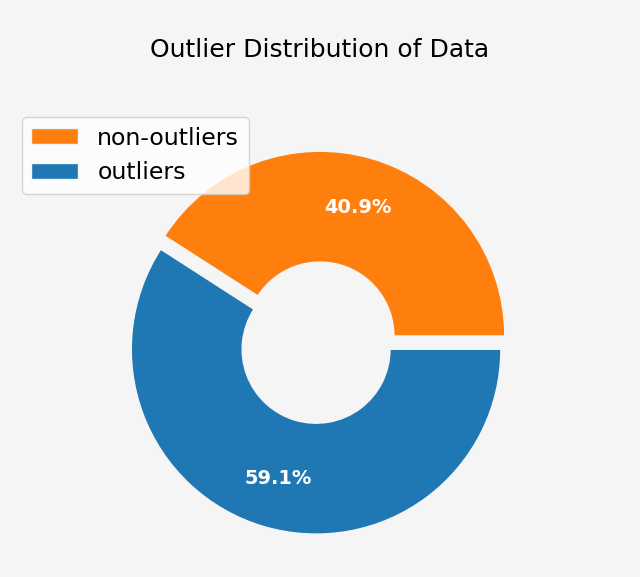

In [37]:
ax:plt.Axes = outlr_detection.plot_class_distribution(for_data=DistributionData.outliers)
_ = ax.set_title(f"{ax.get_title()}", fontdict={'size':18, 'weight':'medium'})

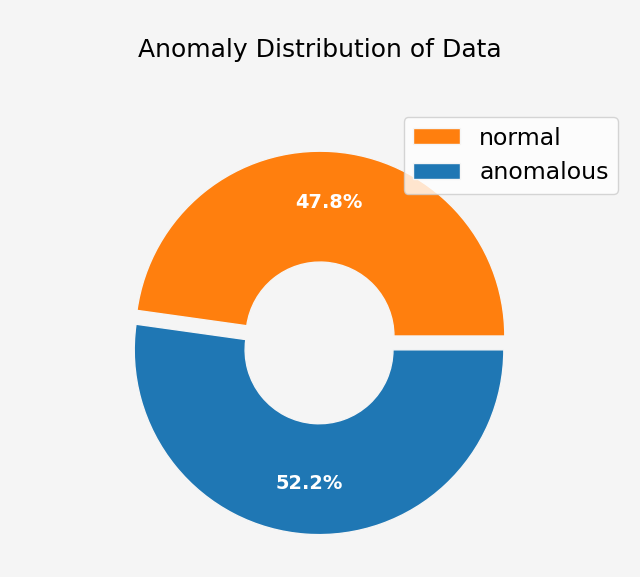

In [38]:
ax:plt.Axes = outlr_detection.plot_class_distribution(for_data=DistributionData.anomalous_data_points)
_ = ax.set_title(f"{ax.get_title()}", fontdict={'size':18, 'weight':'medium'})

In [39]:
outlr_detection.get_input_output_vals()

([[81.48171, 1.2363],
  [81.49122, 1.24029],
  [81.50113, 1.24511],
  [81.51006, 1.24793],
  [81.51932, 1.24979],
  [81.5284, 1.25098],
  [81.5353, 1.25138],
  [81.54192, 1.25136],
  [81.58359, 1.33173],
  [81.72026, 2.0531],
  [81.8423, 2.47565],
  [81.95386, 2.76743],
  [82.0696, 3.04013],
  [82.23703, 3.57433],
  [82.41047, 4.06217],
  [82.58076, 4.46523],
  [82.74444, 4.79546],
  [82.90296, 5.08216],
  [83.06585, 5.3637],
  [83.23459, 5.64451],
  [83.40512, 5.91052],
  [83.59199, 6.19592],
  [83.78882, 6.48086],
  [83.99122, 6.75061],
  [84.18977, 6.99328],
  [84.39279, 7.23863],
  [84.58797, 7.45681],
  [84.76705, 7.63056],
  [84.93921, 7.78431],
  [85.11108, 7.93344],
  [85.2768, 8.06235],
  [85.45181, 8.21015],
  [85.62951, 8.36037],
  [85.79874, 8.48979],
  [85.97246, 8.62049],
  [86.14506, 8.74651],
  [86.31599, 8.86611],
  [86.48506, 8.98113],
  [86.64303, 9.072],
  [86.78479, 9.13204],
  [86.92522, 9.18725],
  [87.06622, 9.24018],
  [87.21269, 9.2988],
  [87.35579, 9.34929],

________________________________________________________________________________________________________________________________________

### Building the Anomaly Detection Models

In [40]:
import matplotlib.colorbar as clrbr
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

In [42]:
class ClassificationModels(Enum):  
    logisticRegression = {
        'name':'Logistic Regression',
        'model':LogisticRegression(
            C=0.05,     
            solver='lbfgs',  
            multi_class='ovr',
            random_state=5
        )
    }

    supportVectorMachine = {  
        'name':'SVC (rbf)',
        'model':SVC(
            C=1, 
            kernel='rbf', 
            gamma=0.01, 
            probability=True, 
            random_state=7
        )
    }

    randomForest = {
        'name':'Random Forest',
        'model':RandomForestClassifier(
            max_depth=3, 
            n_estimators=200, 
            min_samples_leaf=5, 
            max_samples=0.1, 
            max_features=2, 
            n_jobs=-1,
            bootstrap=True,  
            oob_score=False,
            random_state=10
        )
    }

    neuralNetwork = {
        'name':'Neural Network',
        'model':MLPClassifier( 
            hidden_layer_sizes=(5,5,5),
            activation='relu',
            solver='adam',
            alpha=0.0001, 
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=1000,
            random_state=20
        )
    }
    

In [44]:
class SearchParameters(Enum): 
    logisticRegression = {
        'C':[0.00001, 0.0001, 0.001, 0.01, 0.05, 0.1, 1, 5, 10],
        'solver':['lbfgs', 'liblinear']
    }
    supportVectorMachine = {
        'kernel':['rbf', 'poly'],
        'C':[0.01, 0.1, 1, 10, 25, 50, 100],
        'gamma':[0.01, 0.25, 0.5, 0.75, 1.0]
    }
    randomForest = {
        'max_depth':[2, 3, 5, 10, 20],
        'min_samples_leaf':[5, 10, 20, 50, 100, 200],
        'n_estimators':[10, 25, 30, 50, 100, 200]
    }
    neuralNetwork = {
        'hidden_layer_sizes':[(3,3,3), (5,5,5), (10,10,10)],
        'solver':['adam', 'lbfgs'],
        'alpha':[0.0001, 0.001, 0.01, 0.1, 0.5, 1.0]
    }

In [45]:
class DataModeling:
    def __init__(self, input_output_values:list, feature_labels:list[str]): 
        self.__X_train_original = np.array([])
        self.__y_train_original = np.array([])
        self.__X_train = np.array([])
        self.__y_train = np.array([]) 
        self.__X_test = np.array([])
        self.__y_test = np.array([])
        self.__ftrs = [1, 2]    #train_feature indices; maintained due to earlier implementation   #train_features    
        self.__ftr_lbls:list[str] = feature_labels
        self.__fitted_models:dict = {}
        self.__scaler:StandardScaler = StandardScaler()
        self.__completeInit(mdata=input_output_values)


    def __completeInit(self, mdata):
        #Split the data into train and test sets            
        self.__X_train_original,self.__X_test,self.__y_train_original,self.__y_test = train_test_split(mdata[0], mdata[1], train_size=0.8, stratify=mdata[1], random_state=5) 
        self.__resample_data(mdata=[self.__X_train_original,self.__y_train_original])
        

    #Oversampling the less feature of train data using SMOTE
    def __resample_data(self, mdata=[]):   #mdata=[xTrain, yTrain] data        
        counter = Counter(mdata[1])
        print(f'Class Distribution (before oversampling): {counter}')
        oversample = SMOTE(random_state=42)
        self.__X_train, self.__y_train = oversample.fit_resample(mdata[0], mdata[1])
        self.__X_train = np.array(self.__X_train)       #resampled self.__X_train_original dataset
        self.__y_train = np.array(self.__y_train)       #resampled self.__y_train_original 
        self.__scaler = self.__scaler.fit(self.__X_train)
        counter = Counter(self.__y_train)
        print(f'Class Distribution (AFTER oversampling): {counter}') 


    def __extract_categories(self, mdata=[]):   #mdata=[X, y] 
        x_0s = []; x_1s = []        
        for j in range(len(mdata[1])):
            test_for_outlr = mdata[1][j]
            if test_for_outlr==1:
                x_1s.append(mdata[0][j])
            else:
                x_0s.append(mdata[0][j])
        return np.array(x_0s), np.array(x_1s)  
    

    def plot_class_distribution(self)->fgr.Figure:
        ftr_1 = self.__ftrs[0]; ftr_2 = self.__ftrs[1]
        fg:fgr.Figure = plt.figure(figsize=(15, 15), layout='constrained')
        fg.set_facecolor(mpl.colors.to_rgba(c='white', alpha=0))
    
        subfgs:list[fgr.Figure] = fg.subfigures().subfigures(1, 2, wspace=0)
        subfgs[0].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))
        subfgs[0].suptitle('\nBefore Oversampling', size=18, weight='semibold')
        subfgs[1].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.125))
        subfgs[1].suptitle('\nAfter Oversampling', size=18, weight='semibold')

        bfr_sm_axs:list[plt.Axes] = subfgs[0].subplots(3,1)
        format_ax(bfr_sm_axs[0]); format_ax(bfr_sm_axs[1]); format_ax(bfr_sm_axs[2])
        bfr_sm_axs[0].grid(False); bfr_sm_axs[1].grid(False); bfr_sm_axs[2].grid(False)
        
        bfr_sm_axs[0].set_facecolor(plt.rcParams['figure.facecolor'])
        bfr_sm_axs[1].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))
        bfr_sm_axs[1].set_xlabel('')
        bfr_sm_axs[1].set_ylabel(self.__ftr_lbls[1])
        bfr_sm_axs[2].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))
        bfr_sm_axs[2].set_title('\n\n  minority class distribution', size=16, weight='semibold', loc='left', pad=0.05)
        bfr_sm_axs[2].set_xlabel(self.__ftr_lbls[0])
        bfr_sm_axs[2].set_ylabel(self.__ftr_lbls[1])
        
        for spine in bfr_sm_axs[1].spines.values(): spine.set_edgecolor(bfr_sm_axs[1].get_facecolor())
        for spine in bfr_sm_axs[2].spines.values(): spine.set_edgecolor(bfr_sm_axs[2].get_facecolor())

        aft_sm_axs:list[plt.Axes] = subfgs[1].subplots(3,1)
        format_ax(aft_sm_axs[0]); format_ax(aft_sm_axs[1]); format_ax(aft_sm_axs[2])
        aft_sm_axs[0].grid(False); aft_sm_axs[1].grid(False); aft_sm_axs[2].grid(False)
        
        aft_sm_axs[0].set_facecolor(plt.rcParams['figure.facecolor'])
        aft_sm_axs[1].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))
        aft_sm_axs[1].set_xlabel('')
        aft_sm_axs[1].set_ylabel(self.__ftr_lbls[1])
        aft_sm_axs[2].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))
        aft_sm_axs[2].set_title('\n\n  minority class distribution', size=16, weight='semibold', loc='left', pad=0.05)
        aft_sm_axs[2].set_xlabel(self.__ftr_lbls[0])
        aft_sm_axs[2].set_ylabel(self.__ftr_lbls[1])
        
        for spine in aft_sm_axs[1].spines.values(): spine.set_edgecolor(aft_sm_axs[1].get_facecolor())
        for spine in aft_sm_axs[2].spines.values(): spine.set_edgecolor(aft_sm_axs[2].get_facecolor())

        X_train_original_0s, X_train_original_1s = self.__extract_categories(mdata=[self.__X_train_original, self.__y_train_original])
        X_train_0s, X_train_1s = self.__extract_categories(mdata=[self.__X_train, self.__y_train])

        bfr_data=[]; 
        myLbls=[]
        more_0s = len(X_train_original_0s)>len(X_train_original_1s)
        if more_0s:
            bfr_data = [len(X_train_original_1s), len(X_train_original_0s)]
            myLbls = ['anomalous', 'normal']
        else:
            myLbls = ['normal', 'anomalous']
            bfr_data = [len(X_train_original_0s), len(X_train_original_1s)]

        m_colors = ['tab:orange', 'tab:blue']
        bfr_sm_axs[0].axis('equal')  
        bfr_sm_axs[0].pie(
            bfr_data,    
            autopct='%1.1f%%', pctdistance=0.725,
            colors=m_colors,  
            labels=myLbls, labeldistance=None,
            explode=(0.0, 0.075),    
            wedgeprops=dict(width=0.6, edgecolor=subfgs[0].get_facecolor(), linewidth=2),
            textprops=dict(color="w", font=dict(size=14, weight='semibold'))
        )
        _ = bfr_sm_axs[0].legend(facecolor='#ffffff75', fontsize=14)
        hndls, lbls = bfr_sm_axs[0].get_legend_handles_labels()
        bfr_sm_axs[0].legend().remove()

        aft_data=[]
        if more_0s:
            aft_data = [len(X_train_1s), len(X_train_0s)]
        else:
            aft_data = [len(X_train_0s), len(X_train_1s)]

        aft_sm_axs[0].axis('equal')
        aft_sm_axs[0].pie(
            aft_data,    
            autopct='%1.1f%%', pctdistance=0.7,
            colors=m_colors,    
            labels=myLbls, labeldistance=None,
            wedgeprops=dict(width=0.6, edgecolor=subfgs[1].get_facecolor(), linewidth=0),
            textprops=dict(color="w", font=dict(size=14, weight='semibold'))
        )        

        if more_0s:
            bfr_sm_axs[1].scatter([X_train_original_0s[x][ftr_1-1] for x in range(len(X_train_original_0s))], [X_train_original_0s[x][ftr_2-1] for x in range(len(X_train_original_0s))], color=m_colors[1], label=myLbls[1])
            bfr_sm_axs[1].scatter([X_train_original_1s[x][ftr_1-1] for x in range(len(X_train_original_1s))], [X_train_original_1s[x][ftr_2-1] for x in range(len(X_train_original_1s))], color=m_colors[0], label=myLbls[0])
        else:
            bfr_sm_axs[1].scatter([X_train_original_1s[x][ftr_1-1] for x in range(len(X_train_original_1s))], [X_train_original_1s[x][ftr_2-1] for x in range(len(X_train_original_1s))], color=m_colors[1], label=myLbls[1])
            bfr_sm_axs[1].scatter([X_train_original_0s[x][ftr_1-1] for x in range(len(X_train_original_0s))], [X_train_original_0s[x][ftr_2-1] for x in range(len(X_train_original_0s))], color=m_colors[0], label=myLbls[0])
        
        _ = bfr_sm_axs[1].legend(loc='lower center', facecolor='#ffffff75', fontsize=14)
        n_hndls, n_lbls = bfr_sm_axs[1].get_legend_handles_labels()
        bfr_sm_axs[1].legend().remove()

        if more_0s:
            aft_sm_axs[1].scatter([X_train_0s[x][ftr_1-1] for x in range(len(X_train_0s))], [X_train_0s[x][ftr_2-1] for x in range(len(X_train_0s))], color=m_colors[1], label=myLbls[1])
            aft_sm_axs[1].scatter([X_train_1s[x][ftr_1-1] for x in range(len(X_train_1s))], [X_train_1s[x][ftr_2-1] for x in range(len(X_train_1s))], color=m_colors[0], label=myLbls[0])
        else:
            aft_sm_axs[1].scatter([X_train_1s[x][ftr_1-1] for x in range(len(X_train_1s))], [X_train_1s[x][ftr_2-1] for x in range(len(X_train_1s))], color=m_colors[1], label=myLbls[1])
            aft_sm_axs[1].scatter([X_train_0s[x][ftr_1-1] for x in range(len(X_train_0s))], [X_train_0s[x][ftr_2-1] for x in range(len(X_train_0s))], color=m_colors[0], label=myLbls[0])
                
        if more_0s:
            bfr_sm_axs[2].scatter([X_train_original_1s[x][ftr_1-1] for x in range(len(X_train_original_1s))], [X_train_original_1s[x][ftr_2-1] for x in range(len(X_train_original_1s))], color=m_colors[0], label=myLbls[0])
            aft_sm_axs[2].scatter([X_train_1s[x][ftr_1-1] for x in range(len(X_train_1s))], [X_train_1s[x][ftr_2-1] for x in range(len(X_train_1s))], color=m_colors[0], label=myLbls[0])
        else:
            bfr_sm_axs[2].scatter([X_train_original_0s[x][ftr_1-1] for x in range(len(X_train_original_0s))], [X_train_original_0s[x][ftr_2-1] for x in range(len(X_train_original_0s))], color=m_colors[0], label=myLbls[0])
            aft_sm_axs[2].scatter([X_train_0s[x][ftr_1-1] for x in range(len(X_train_0s))], [X_train_0s[x][ftr_2-1] for x in range(len(X_train_0s))], color=m_colors[0], label=myLbls[0])

        if not(more_0s):
            n_hndls.insert(0, n_hndls[1]); _=n_hndls.pop()
            n_lbls.insert(0, n_lbls[1]); _=n_lbls.pop()
        hndls = hndls + n_hndls
        lbls = lbls + n_lbls
        
        fg.legend(hndls, lbls, facecolor=plt.rcParams['figure.facecolor'], framealpha=1, bbox_to_anchor=(1, 1), loc='lower right', ncols=4, borderaxespad=0.01)
        
        return fg


    def scale_data(self, X_data=np.array([])):
        return self.__scaler.transform(X_data)

    
    def train_models(self, models=[ClassificationModels]): 
        if (len(models) != 0):             
            # Scaling the input data
            X_train = self.__scaler.transform(self.__X_train)      
            y_train = self.__y_train  

            for mdl in models:
                print(f"\nTRAINING THE {mdl.value['name']} MODEL.")
                self.__fitted_models[mdl.name] = (mdl.value["model"]).fit(X_train, y_train)
                print(f"Finished training the {mdl.value['name']} model.")


    def evaluate_model(self, model:ClassificationModels, for_testData:bool=True)->dict|None:        
        try:   
            ftd_mdl = self.__fitted_models[model.name]
            mdl_evals:dict = {}
            X = self.__X_test if for_testData else self.__X_train_original
            y = self.__y_test if for_testData else self.__y_train_original 
            y_pred = self.make_prediction(X_data=X, with_model=model)
            
            mdl_evals['accuracy'] = ftd_mdl.score(self.scale_data(X), y)
            mdl_evals['precision'] = metrics.precision_score(y_true=y, y_pred=y_pred)
            mdl_evals['sensitivity'] = metrics.recall_score(y_true=y, y_pred=y_pred)
            mdl_evals['f1_score'] = metrics.f1_score(y_true=y, y_pred=y_pred)
            mdl_evals['specificity'] = metrics.recall_score(y_true=y, y_pred=y_pred, pos_label=0)
            mdl_evals['report'] = metrics.classification_report(y_true=y, y_pred=y_pred)
            
            conf_m = metrics.confusion_matrix(y_true=y, y_pred=y_pred)
            mdl_evals['confusion_matrix'] = conf_m

            y_proba = ftd_mdl.predict_proba(self.scale_data(X))
            fpr, tpr, tholds = metrics.roc_curve(y_true=y, y_score=y_proba[:,1])
            mdl_evals['auc_roc_fpr'] = fpr
            mdl_evals['auc_roc_tpr'] = tpr
            mdl_evals['auc_roc_tholds'] = tholds
            mdl_evals['roc_auc_score'] = metrics.roc_auc_score(y_true=y, y_score=y_proba[:,1])

            return mdl_evals
        except:
            print(Fore.RED+"\nError! "+Fore.GREEN+f"The model {model} has not yet been fitted with the train data. Fit the model with the train data before issuing this command.\n") #Error Message
            return None
        

    def plot_auc_roc_curve(self, on_ax:plt.Axes, model:ClassificationModels, for_testData:bool=True):
        mdl_evals = self.evaluate_model(model=model, for_testData=for_testData)
        on_ax.plot(
            mdl_evals['auc_roc_fpr'], mdl_evals['auc_roc_tpr'], 
            c='tab:blue', linewidth=3, 
            label=f"{model.value['name']}\n(score = {mdl_evals['roc_auc_score']:.4f})"
        )
        on_ax.grid(linestyle='-', linewidth=1, color='whitesmoke', alpha=1)
        on_ax.set_xlabel('False Positive Rate') 
        on_ax.set_ylabel('True Positive Rate')  
        on_ax.set_title(f"\nAUC-ROC Curve")


    def plot_auc_roc_curve_compared(self, models:list[ClassificationModels], for_testData:bool=True)->fgr.Figure:
        fg:fgr.Figure = plt.figure(figsize=(5*len(models),5), constrained_layout=True)
        axs:list[plt.Axes] = fg.subplots(1,len(models), sharey=True)

        for mdl in models:
            ndx = models.index(mdl)
            mdl_evls = self.evaluate_model(model=mdl, for_testData=for_testData)
            self.plot_auc_roc_curve(on_ax=axs[ndx], model=mdl, for_testData=for_testData)
            axs[ndx].set_title(f"\n{mdl.value['name']}", size=20, weight='semibold', pad=20)

            if ndx==0:
                axs[ndx].set_xlabel('False Positive Rate')
                axs[ndx].set_ylabel('True Positive Rate')
            else:
                axs[ndx].set_xlabel('')
                axs[ndx].set_ylabel(' ', fontdict={'size':10})

            axs[ndx].text(
                0.47, 0.1,
                (f" ROC-AUC Score \n = {mdl_evls['roc_auc_score']:.4f}").lstrip("0"),
                size=18,
                weight='medium',
                bbox=dict(boxstyle='round', alpha=0.8, facecolor='white'),
                horizontalalignment='left',    
                verticalalignment='center'
            )
        return fg


    def create_report_table(self, for_models:list[ClassificationModels], for_testData:bool=True, col_width:float=0.2, col_row_scale:tuple=(3,5), loc:str='center', z_order:int=2, font_size:float=20):
        ax:plt.Axes = get_plot_ax()
        ax.set_axis_off()
        ax.figure.set_size_inches(10,3.5)

        col_widths = [col_width]*6
        col_lbls = ['MODEL', 'accuracy', 'precision', 'sensitivity', 'f1-score', 'specificity']

        tbl_vals = []
        for mdl in for_models:
            mdl_evls = self.evaluate_model(model=mdl, for_testData=for_testData)
            tbl_vals.append(
                [mdl.value['name'],
                mdl_evls['accuracy'], 
                mdl_evls['precision'], 
                mdl_evls['sensitivity'], 
                mdl_evls['f1_score'], 
                mdl_evls['specificity']]
            )

        for j in range(len(tbl_vals)):
            for k in range(1, len(tbl_vals[0])):
                tbl_vals[j][k] = round(tbl_vals[j][k], 5)
        
        rpt_tbl = ax.table(
            cellText=tbl_vals,
            colLabels=col_lbls,
            colColours=['steelblue'] * len(tbl_vals[0]),
            colWidths=col_widths,   
            loc=loc,
            fontsize=font_size 
        )
        rpt_tbl.scale(col_row_scale[0], col_row_scale[1]) 
        rpt_tbl.set_zorder(z_order)

        tbl_cls = rpt_tbl.get_celld()
        for ndx in list(tbl_cls.keys()):
            cl = tbl_cls[(ndx[0], ndx[1])]
            cl.PAD = 0.05
            if ndx[0]==0:
                cl.get_text().set(color='w', weight='semibold')
                cl.set_facecolor('#001a4d')
            if ndx[1]==0: 
                cl.get_text().set(weight='semibold')

            ax.figure
        return rpt_tbl


    def make_prediction(self, X_data, with_model:ClassificationModels): #X_data is an [np_array, n_array] with columns for features
        ftd_mdl = self.__fitted_models[with_model.name]                
        X = self.__scaler.transform(X_data)
        y_pred = ftd_mdl.predict(X)
        return y_pred


    def get_trained_models(self):
        return self.__fitted_models


    def get_train_test_original_data(self):
        train = [self.__X_train_original, self.__y_train_original]
        test = [self.__X_test, self.__y_test]
        return train, test


    def get_train_test_data(self): 
        train = [self.__X_train, self.__y_train]
        test = [self.__X_test, self.__y_test]
        return train, test


    def plot_decision_surface_boundary(self, model:ClassificationModels, ax:plt.Axes, plot_surface=True, plot_boundary=False, plot_support_vectors=False)->DecisionBoundaryDisplay:         
        ax.grid(False)
        cm = plt.cm.RdBu     

        X_data = self.__scaler.transform(self.__X_train)     
        xlim = [X_data[:,0].min(), X_data[:,0].max()] 
        ylim = [X_data[:,1].min(), X_data[:,1].max()] 
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        
        ftd_mdl = self.__fitted_models[model.name]
        dsp:DecisionBoundaryDisplay = None
        if plot_surface:
            dsp = DecisionBoundaryDisplay.from_estimator(
                estimator = ftd_mdl, 
                X = X_data, 
                cmap = cm, 
                alpha = 0.75, 
                ax = ax, 
                response_method='predict_proba'
            ) 

        if plot_boundary:
            DecisionBoundaryDisplay.from_estimator(
                estimator = ftd_mdl,
                X = X_data,
                plot_method="contour",
                colors="k",
                levels=[-1, 0, 1],
                alpha=0.8,
                linestyles=["--", "-", "--"],
                ax=ax
            )    

        if plot_support_vectors and plot_boundary and model==ClassificationModels.supportVectorMachine:
            ax.scatter(
                ftd_mdl.support_vectors_[:, 0],
                ftd_mdl.support_vectors_[:, 1],
                s=80,
                linewidth=1,
                facecolors="none",
                edgecolors="k",
                zorder = 10
            )
        return dsp


    def plot_scaled_dataset(self, mdata=[np.array([])], ax:plt.Axes=None, plt_size=50, plt_color="b"):  #mdata=[X_data,y_pred]                 
        X = self.__scaler.transform(mdata[0])        
        X_0s, X_1s = self.__extract_categories([X,mdata[1]])
        
        if len(X_1s)>0:
            ax.scatter(
                x = X_1s[:, 0],  
                y = X_1s[:, 1], 
                c = 'r', 
                s = plt_size,
                edgecolors = "k",
                label = 'anomalous'
            ) 

        if len(X_0s)>0:
            ax.scatter(
                x = X_0s[:, 0],  
                y = X_0s[:, 1], 
                c = plt_color, 
                s = plt_size,
                edgecolors = "k",
                label = 'normal'    
            )

        xlim = [min(X[:,0].min(), ax.get_xlim()[0]), max(X[:,0].max(), ax.get_xlim()[1])]
        ylim = [min(X[:,1].min(), ax.get_ylim()[0]), max(X[:,1].max(), ax.get_ylim()[1])]
        xmgn = 0.05*(xlim[1]-xlim[0])
        ymgn = 0.05*(ylim[1]-ylim[0])
        xlim = [xlim[0]-xmgn,xlim[1]+xmgn]
        ylim = [ylim[0]-ymgn,ylim[1]+ymgn]
        ax.set_xlim(xlim) 
        ax.set_ylim(ylim) 
        ax.grid(False)
    

    def plot_models_compared(self, models:list[ClassificationModels], show_colorbar:bool=True)->list:
        rws = 2; cls = len(models)+1
        fg:fgr.Figure = plt.figure(figsize=(4*cls, 10), constrained_layout=True) 
        fg.set_facecolor(mpl.colors.to_rgba(c='white', alpha=0)) 
        axs:list[list[plt.Axes]] = fg.subfigures().subplots(rws,cls) 
        
        ax:plt.Axes = axs[0][0] 
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
        ax.set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.1))
        ax.set_title('\nInput Data', fontsize=23, fontweight='medium')
        ax.set_ylabel('Train Data', fontsize=20, fontweight='semibold')
        self.plot_scaled_dataset(mdata=[self.__X_train_original,self.__y_train_original], ax=ax)    
        ax.legend()
        hndls, lbls = ax.get_legend_handles_labels()
        ax.legend().remove()
        
        ax:plt.Axes = axs[1][0] 
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(True)
        ax.set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.1))
        ax.set_ylabel('Test Data', fontsize=20, fontweight='semibold')
        self.plot_scaled_dataset(mdata=[self.__X_test,self.__y_test], ax=ax)    
        
        X = np.array([]); y_pred = np.array([]) 
        dsp:DecisionBoundaryDisplay = None   

        for j in [0,1]:
            if j==0: X = self.__X_train_original
            else: X = self.__X_test

            for k in range(len(models)):
                score = 0
                ax:plt.Axes = axs[j][k+1]
                ax.set_xticks([]); ax.set_yticks([]); ax.grid(True)
                
                if j==0:
                    ax.set_title(f"\n{models[k].value['name']}", size=23, weight='medium')
                    score = self.evaluate_model(model=models[k], for_testData=False)['accuracy']
                else:
                    score = self.evaluate_model(model=models[k], for_testData=True)['accuracy']
                
                y_pred = self.make_prediction(X_data=X, with_model=models[k])
                
                dsp = self.plot_decision_surface_boundary(
                    model=models[k],
                    ax=ax,
                    plot_surface=True,
                    plot_boundary=True
                )
                self.plot_scaled_dataset(
                    mdata=[X, y_pred],
                    ax=ax
                )
                ax.text(
                    0.95, 0.06,
                    (f"{score:.2f}").lstrip("0"),
                    size=18,
                    weight='semibold',
                    bbox=dict(boxstyle='round', alpha=0.8, facecolor='white'),
                    transform=ax.transAxes,
                    horizontalalignment='right',    
                    verticalalignment='center'
                )
                        
        fg.legend(hndls, lbls, facecolor=plt.rcParams['figure.facecolor'], framealpha=1, fontsize=22, bbox_to_anchor=(0., 1.02, 1., .11), loc='lower right', ncols=5, borderaxespad=0.01)        
        
        clbr:clrbr.Colorbar = None
        if show_colorbar:
            clbr = fg.colorbar(dsp.surface_, ax=(list(axs[0])+list(axs[1])), orientation='horizontal', aspect=35, fraction=0.05, pad=0.055)
            clbr.ax.tick_params(axis='x', labelsize=19, colors='k')
        
        return fg, clbr


    def plot_conf_matrix(self, mdata, model:ClassificationModels, ax=plt.Axes, labels:list=[], cmap=plt.cm.Blues, normalize_data=None)->metrics.ConfusionMatrixDisplay: 
        xdta = mdata[0]
        ydta = mdata[1]
        ypred = self.make_prediction(X_data=xdta, with_model=model)
        dsp = metrics.ConfusionMatrixDisplay.from_predictions(
            y_true=ydta,
            y_pred=ypred,
            ax=ax,
            labels=labels,
            cmap=cmap,
            normalize=normalize_data
        )
        ax.grid(False)
        return dsp


    def plot_confusion_matrices_compared(self, models:list[ClassificationModels]):         
        cls = len(models)
        fg = plt.figure(constrained_layout=True, figsize=(5*cls, 10))
        fg.set_facecolor(mpl.colors.to_rgba(c='white', alpha=0))  

        subfgs:list[fgr.Figure] = fg.subfigures().subfigures(2, 1, hspace=0)
        subfgs[0].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))   
        subfgs[0].suptitle('\nTrain Data', size=22, weight='semibold')
        subfgs[1].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.125))   
        subfgs[1].suptitle('\nTest Data', size=22, weight='semibold')

        X = np.array([]);   y = np.array([])

        for j in [0,1]:
            axs:list[plt.Axes] = subfgs[j].subplots(1, cls) 
            if j==0:  
                X = self.__X_train_original
                y = self.__y_train_original
            else:
                X = self.__X_test
                y = self.__y_test

            for k in range(cls):
                dsp = self.plot_conf_matrix(
                    mdata=[X,y],
                    model=models[k],
                    ax=axs[k],  
                    labels=None 
                )

                if j==0: axs[k].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.05))    
                else: axs[k].set_facecolor(mpl.colors.to_rgba(c='k', alpha=0.125))     
                
                dsp.ax_.set_title(f"{models[k].value['name']}", size=20, weight='medium', pad=20)
                dsp.ax_.tick_params(color='k', labelcolor='#002266')     
                dsp.ax_.tick_params(axis='y', rotation=90)
                dsp.ax_.set_xticklabels(['Normal','Anomalous'], fontsize=16)  
                dsp.ax_.set_yticklabels(['Normal','Anomalous'], fontsize=16, verticalalignment='center') 
                dsp.figure_.axes[-1].tick_params(colors='k', labelsize=16)                 
                
                if k==0:
                    dsp.ax_.set_xlabel('Predicted', fontsize=18)  
                    dsp.ax_.set_ylabel('Actual', fontsize=18) 
                else:
                    dsp.ax_.set_xlabel('', fontsize=18)
                    dsp.ax_.set_ylabel('', fontsize=18)

                for labels in dsp.text_.ravel():
                    labels.set_fontsize(20)
                    labels.set_fontweight('medium')                
        return fg

In [46]:
#Initial Input and Output vals
X,y = outlr_detection.get_input_output_vals()   

#Data features to use for training
data_modeling = DataModeling(
    input_output_values=[X,y],          # X=set of input values, y=set of corresponding output values (labels)
    feature_labels=['mean','std']
)  

data_modeling.train_models(
    models=[
        ClassificationModels.logisticRegression,
        ClassificationModels.supportVectorMachine,
        ClassificationModels.randomForest,
        ClassificationModels.neuralNetwork
    ]
)


Class Distribution (before oversampling): Counter({1.0: 18358, 0.0: 14066})
Class Distribution (AFTER oversampling): Counter({0.0: 18358, 1.0: 18358})

TRAINING THE Logistic Regression MODEL.
Finished training the Logistic Regression model.

TRAINING THE SVC (rbf) MODEL.
Finished training the SVC (rbf) model.

TRAINING THE Random Forest MODEL.
Finished training the Random Forest model.

TRAINING THE Neural Network MODEL.
Finished training the Neural Network model.


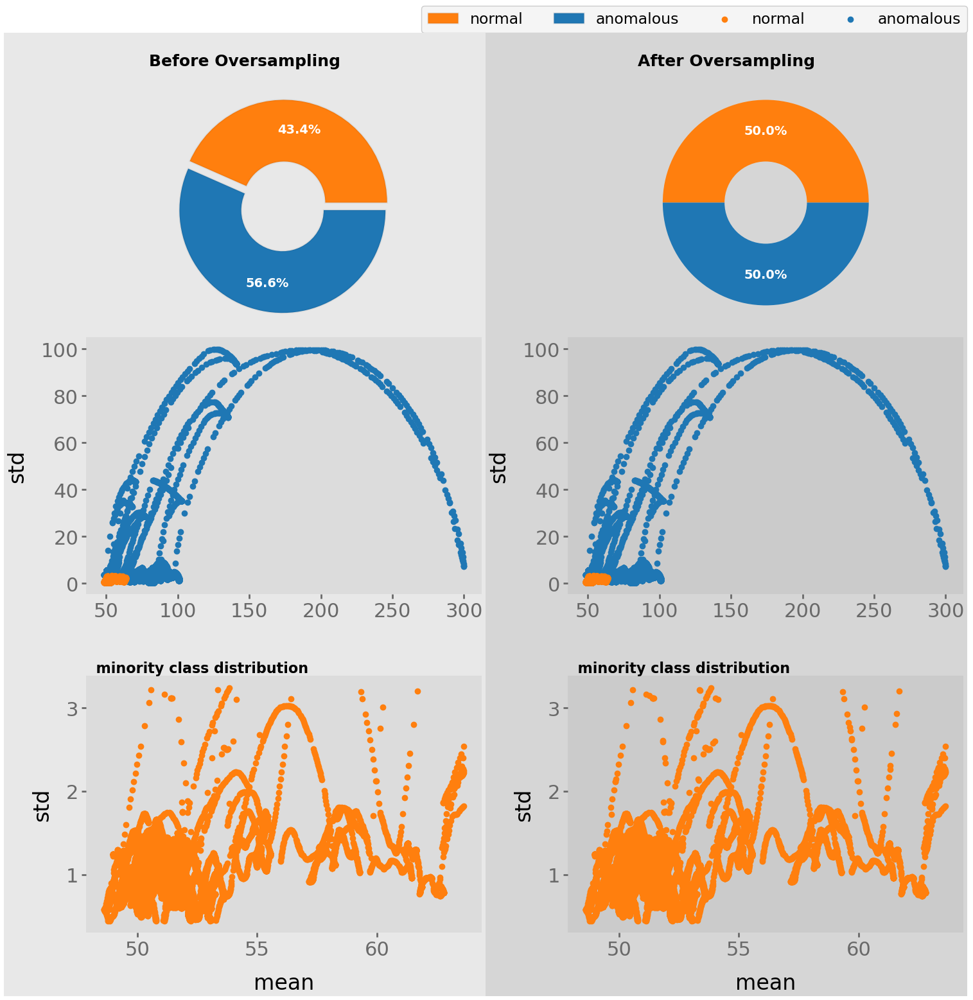

In [47]:
fg = data_modeling.plot_class_distribution()

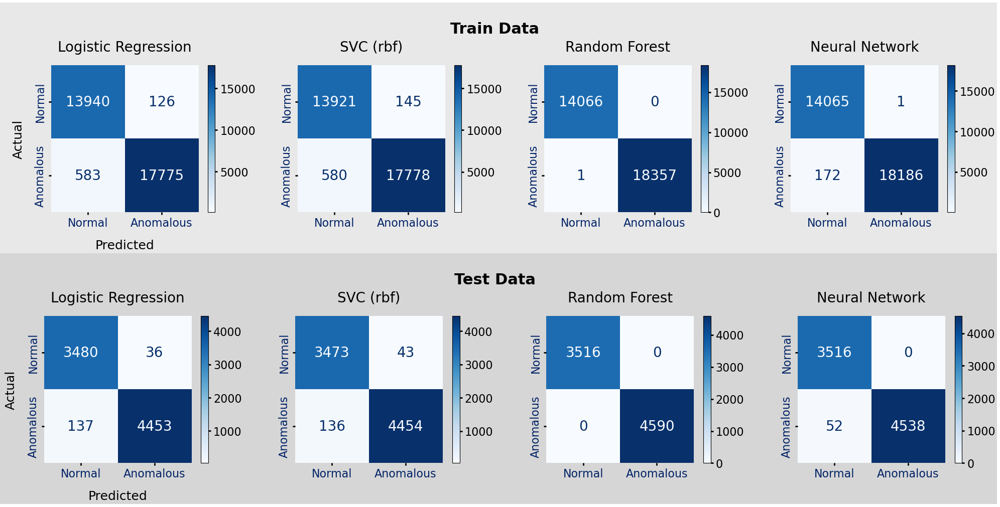

In [48]:
fg = data_modeling.plot_confusion_matrices_compared(
    models=[
        ClassificationModels.logisticRegression,
        ClassificationModels.supportVectorMachine,
        ClassificationModels.randomForest,
        ClassificationModels.neuralNetwork
    ]
)


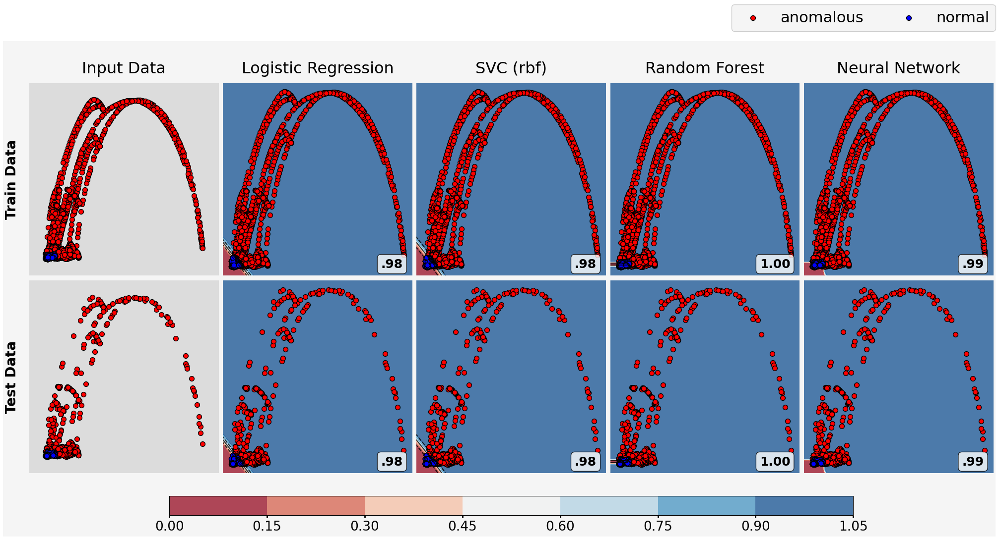

In [49]:
fg,clbr = data_modeling.plot_models_compared(
    models=[
        ClassificationModels.logisticRegression,
        ClassificationModels.supportVectorMachine,
        ClassificationModels.randomForest,
        ClassificationModels.neuralNetwork
    ]
)


In [50]:
mdls=[
  ClassificationModels.logisticRegression, ClassificationModels.supportVectorMachine, 
  ClassificationModels.randomForest, ClassificationModels.neuralNetwork
]

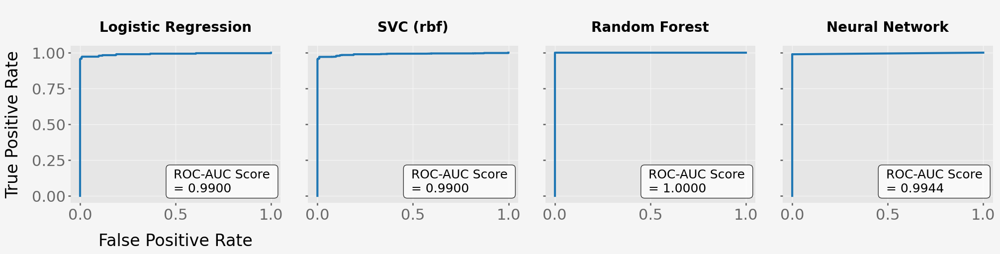

In [51]:
fg = data_modeling.plot_auc_roc_curve_compared(models=mdls, for_testData=True)

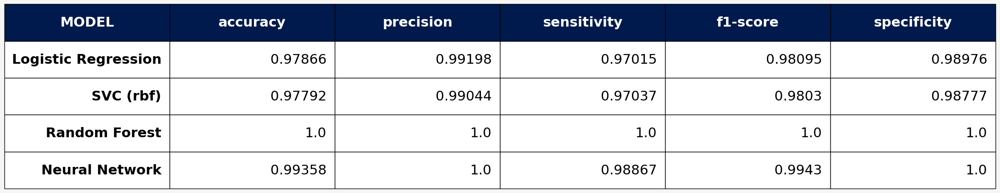

In [52]:
rptTbl = data_modeling.create_report_table(for_models=mdls, for_testData=True, col_width=0.16, col_row_scale=[3,5])

In [ ]:
outlr_detection.plot_decision_surface_boundary()

#### Hyper-parameter Tuning of Model (GridSearch and CrossValidation)

In [65]:
train_data, test_data = data_modeling.get_train_test_data()
X_train = train_data[0];    y_train = train_data[1]

def tune_hyperparameters(for_model:ClassificationModels):
  ftd_model = data_modeling.get_trained_models()[for_model.name]
  search_params:dict = {}

  for mdl in SearchParameters:
    if mdl.name==for_model.name:
      search_params = mdl.value
      break

  grid_search = GridSearchCV(
      estimator=ftd_model,
      param_grid=search_params,
      n_jobs=-1,
      cv=5,
      verbose=1, 
      scoring='accuracy' 
  )

  search_result = grid_search.fit(X=X_train, y=y_train)
  return search_result

In [77]:
result = tune_hyperparameters(for_model=ClassificationModels.logisticRegression)
result

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5,
             estimator=LogisticRegression(C=0.05, multi_class='ovr',
                                          random_state=5),
             n_jobs=-1,
             param_grid={'C': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 1, 5, 10],
                         'solver': ['lbfgs', 'liblinear']},
             scoring='accuracy', verbose=1)

In [78]:
print(f"result.best_score_: {result.best_score_}")
print(f"result.best_params_: {result.best_params_}")
print(f"result.best_estimator_: {result.best_estimator_}")

result.best_score_: 0.9844754626773916
result.best_params_: {'C': 1, 'solver': 'liblinear'}
result.best_estimator_: LogisticRegression(C=1, multi_class='ovr', random_state=5, solver='liblinear')
